## Post EDA

### Load Libraries

In [1]:
import torch
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
import config
import os
from utils import (
    get_data_loaders,
    load_checkpoint,
    display_metrics,
    get_TableMasks,
    fixMasks,
    display
    )
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from model import TableNet
from pytorch_model_summary import summary
import tensorboard
from sklearn.model_selection import train_test_split
import albumentations as A 
from albumentations.pytorch import ToTensorV2

### Load Trained Model

In [2]:
model = TableNet(encoder = 'densenet', use_pretrained_model = True, basemodel_requires_grad = True)

print("Model Architecture and Trainable Paramerters")
print("="*50)
print(summary(model, torch.zeros((1, 3, 1024, 1024)), show_input=False, show_hierarchical=False))

Model Architecture and Trainable Paramerters
-------------------------------------------------------------------------------------------------------------
      Layer (type)                                              Output Shape         Param #     Tr. Param #
        DenseNet-1     [1, 256, 64, 64], [1, 512, 32, 32], [1, 1024, 32, 32]       6,951,808       6,951,808
          Conv2d-2                                          [1, 256, 32, 32]         262,400         262,400
            ReLU-3                                          [1, 256, 32, 32]               0               0
         Dropout-4                                          [1, 256, 32, 32]               0               0
          Conv2d-5                                          [1, 256, 32, 32]          65,792          65,792
            ReLU-6                                          [1, 256, 32, 32]               0               0
         Dropout-7                                          [1, 256, 32, 32]      

In [3]:
model = model.to(config.DEVICE)

#load checkpoint
last_epoch, tr_metrics,te_metrics = load_checkpoint(torch.load("densenet_model_checkpoint.pth.tar"), model)
display_metrics(last_epoch, tr_metrics,te_metrics)

Loading checkpoint...
Epoch: 47 
            Table Loss -- Train: 0.015 Test: 0.025
            Table Acc -- Train: 0.995 Test: 0.992
            Table F1 -- Train: 0.714 Test: 0.691
            Table Precision -- Train: 0.714 Test: 0.686
            Table Recall -- Train: 0.716 Test: 0.701
            
            Col Loss -- Train: 0.031 Test: 0.035
            Col Acc -- Train: 0.987 Test: 0.986
            Col F1 -- Train: 0.654 Test: 0.629
            Col Precision -- Train: 0.655 Test: 0.611
            Col Recall -- Train: 0.658 Test: 0.662
        


### Load Data

In [9]:
processed_data = pd.read_csv('F:/Deep Learning/appliedai_submissions/Self Case Study/Case Study 2/processed_data.csv')
train_data, test_data  = train_test_split(processed_data, test_size = 0.2, random_state = config.SEED, stratify = processed_data.hasTable)

### Check Train Data

In [10]:
train_data = train_data[train_data.hasTable == 1]

In [11]:
t_precision, t_recall, t_f1 = [], [], []
c_precision, c_recall, c_f1 = [], [], []

In [12]:
for i in tqdm(range(len(train_data))):
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = (np.array(Image.open("../" + train_data.iloc[i,1]))/255.0).reshape(-1,1)
    test_col = (np.array(Image.open("../" + train_data.iloc[i,2]))/255.0).reshape(-1,1)

    table_out, column_out = get_TableMasks(test_img, model)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)

    t_precision.append(precision_score(test_table, table_out, zero_division = 0))
    t_recall.append(recall_score(test_table, table_out, zero_division = 0))
    t_f1.append(f1_score(test_table, table_out, zero_division = 0))
    
    c_precision.append(precision_score(test_col, column_out, zero_division = 0))
    c_recall.append(recall_score(test_table, table_out, zero_division = 0))
    c_f1.append(f1_score(test_table, table_out, zero_division = 0))
    

100%|████████████████████████████████████████████████████████████████████████████████| 399/399 [14:13<00:00,  2.14s/it]


### Lets pick a threshold for categorizing worst, good and best predictions

**0.0 - 0.50 : Bad Predictions**

**0.5 - 0.85 : Good Predictions**

**0.85 - 0.1 : Best Predictions**



## Lets See Images based on F1 Scores

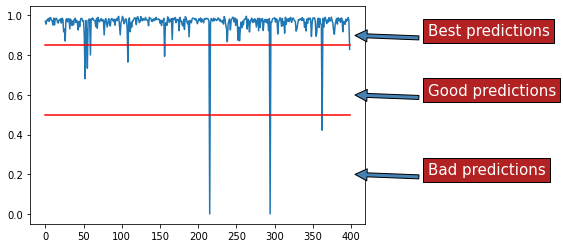

In [13]:
plt.plot(t_f1)
plt.plot([*range(len(t_f1))], [0.5]*len(t_f1), '-r', label='Bad Predictions')
plt.plot([*range(len(t_f1))], [0.85]*len(t_f1), '-r', label='Good Predictions')

#https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html
plt.annotate('Bad predictions', xy=(400, 0.2), xytext=(500, 0.2),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Good predictions', xy=(400, 0.6), xytext=(500, 0.6),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Best predictions', xy=(400, 0.9), xytext=(500, 0.9),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')
plt.show()

### Bad Predictions

In [14]:
bad_pred_idx = [i for i, x in enumerate(t_f1) if x < 0.5 ]

In [15]:
bad_pred_idx

[215, 294, 362]

Index : 215


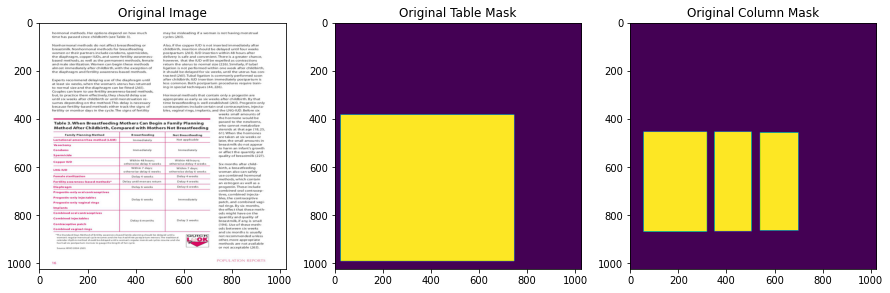

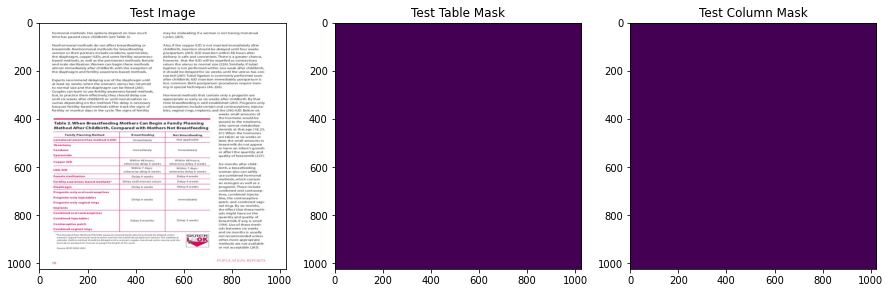

Table F1 : 0.000
Column F1 : 0.000
Index : 294


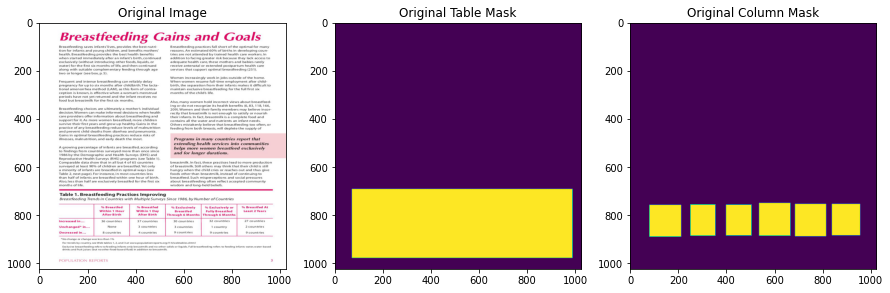

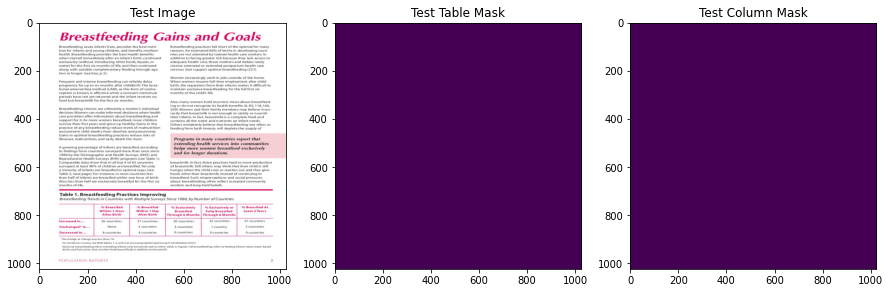

Table F1 : 0.000
Column F1 : 0.000
Index : 362


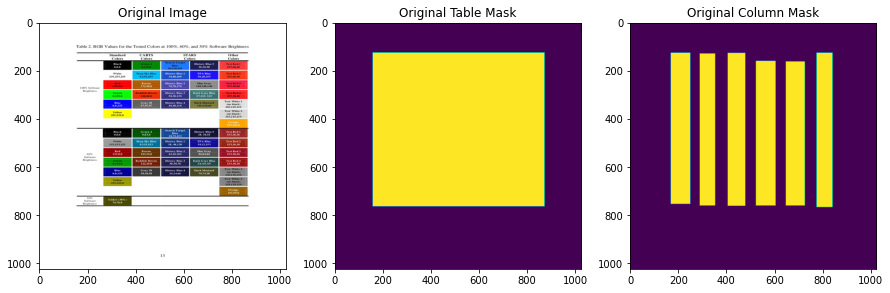

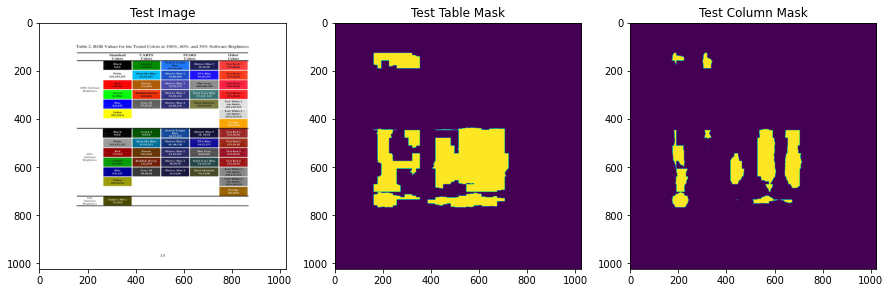

Table F1 : 0.422
Column F1 : 0.302


In [16]:
for i in bad_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
    print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
    print("=" * 40)
          
    

### Good Prediction

In [17]:
good_pred_idx = [i for i, x in enumerate(t_f1) if (x >= 0.5) and (x < 0.85) ]

In [18]:
good_pred_idx

[52, 55, 59, 108, 156, 398]

Index : 52


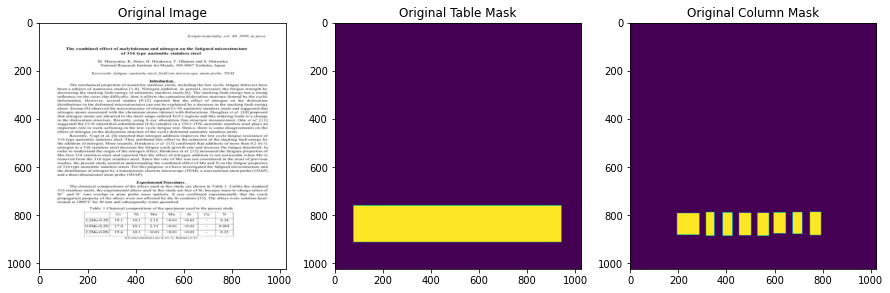

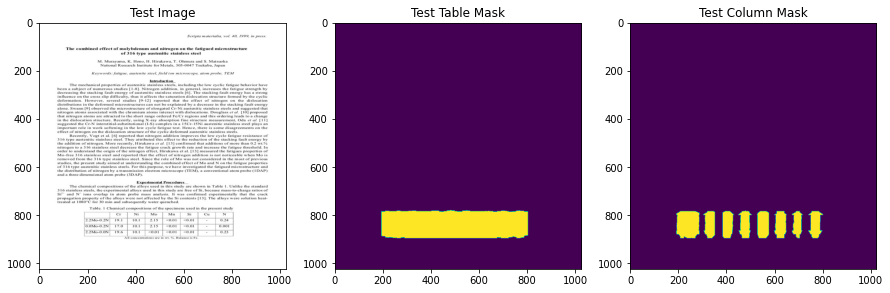

Table F1 : 0.681
Column F1 : 0.881
Index : 55


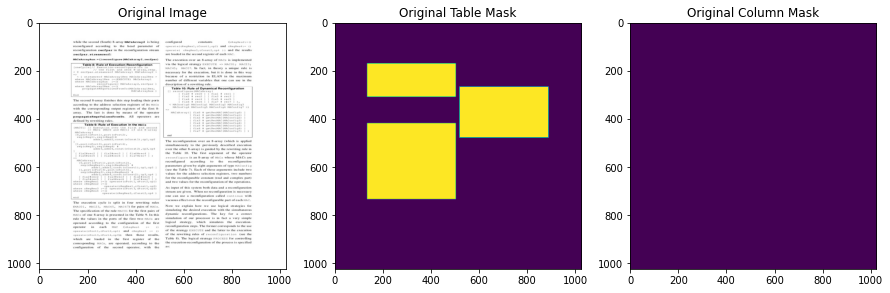

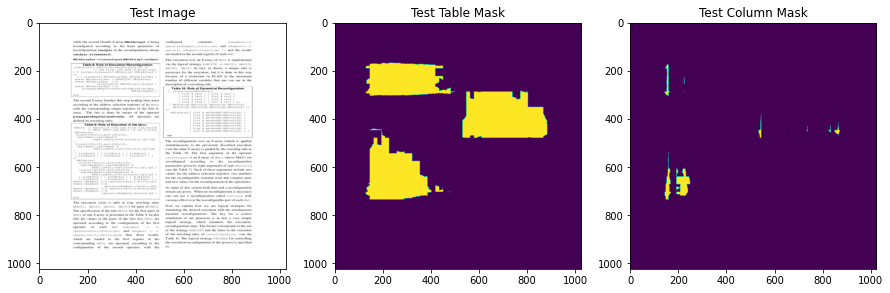

Table F1 : 0.734
Column F1 : 0.000
Index : 59


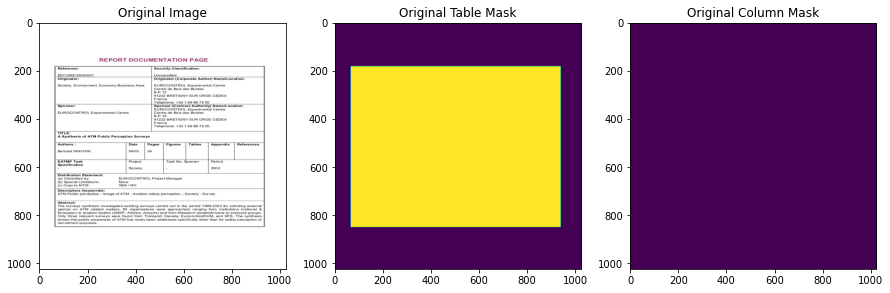

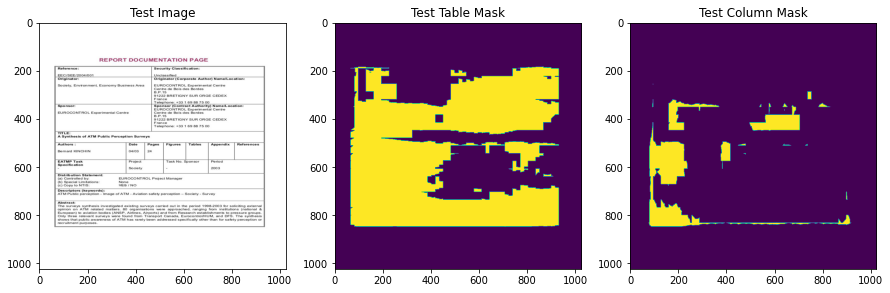

Table F1 : 0.801
Column F1 : 0.000
Index : 108


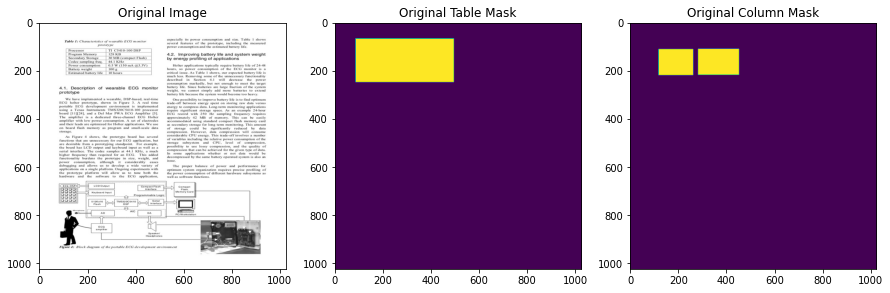

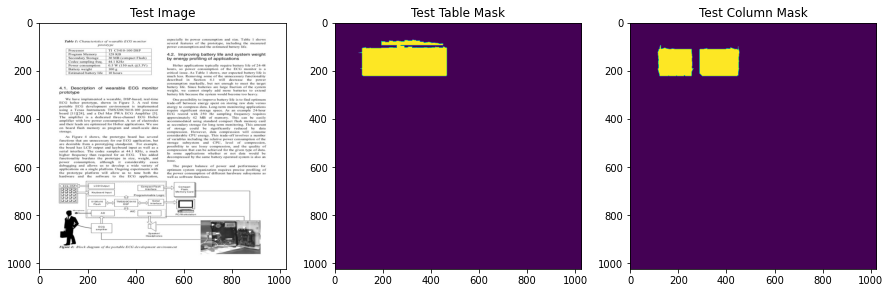

Table F1 : 0.765
Column F1 : 0.955
Index : 156


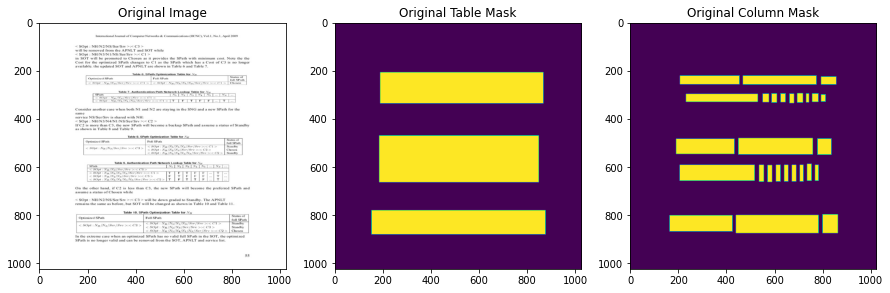

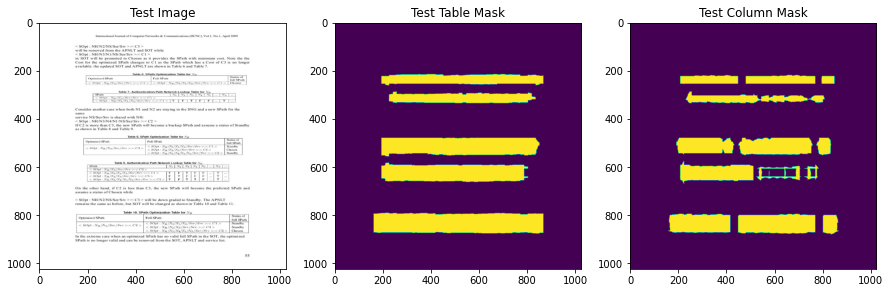

Table F1 : 0.794
Column F1 : 0.894
Index : 398


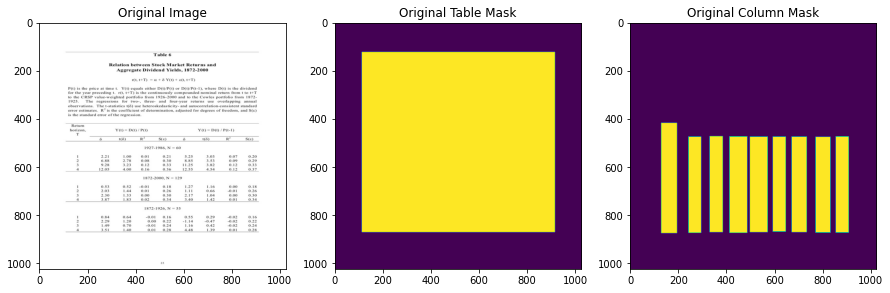

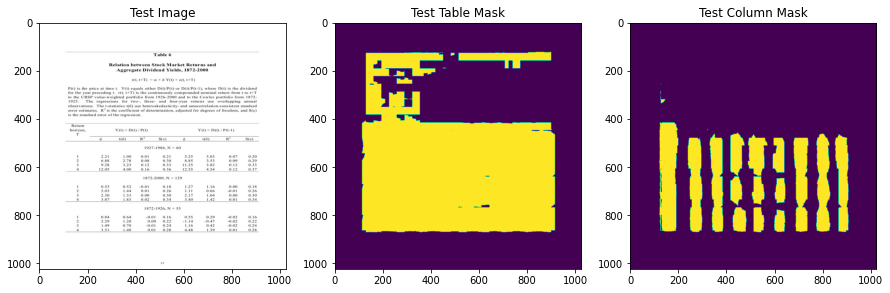

Table F1 : 0.829
Column F1 : 0.832


In [19]:
for i in good_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
    print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
    print("=" * 40)
          
    

### Best Predictions

In [20]:
best_pred_idx = [i for i, x in enumerate(t_f1) if x >= 0.85 ]

Index : 0


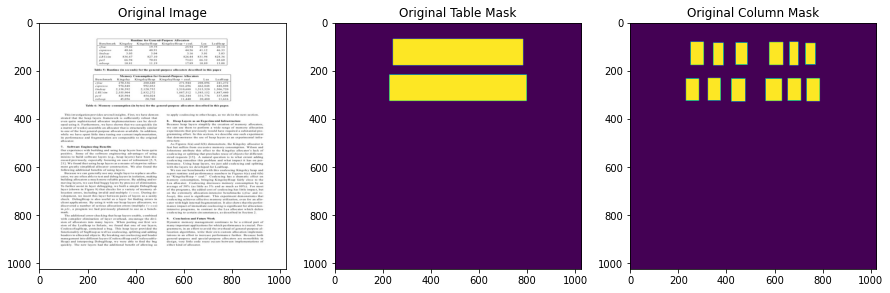

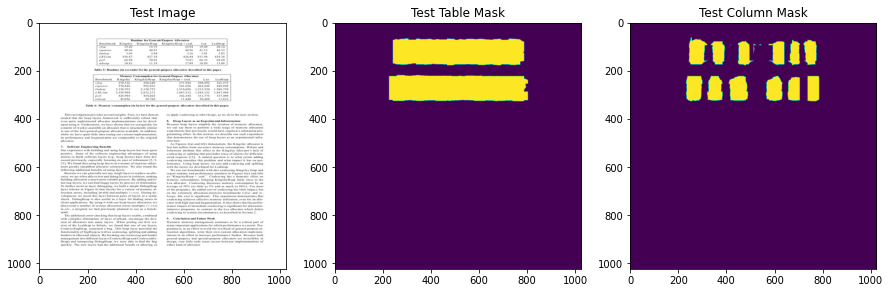

Table F1 : 0.971
Column F1 : 0.865
Index : 1


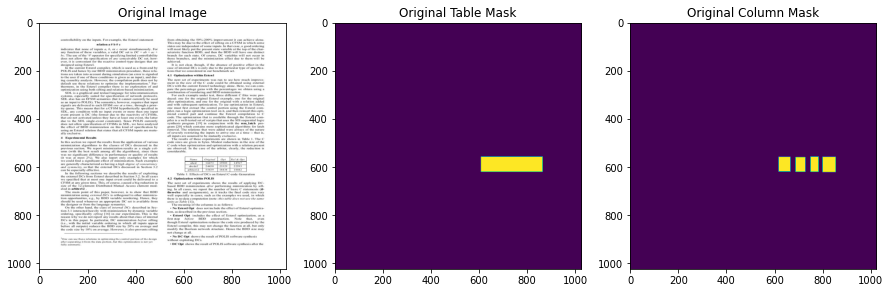

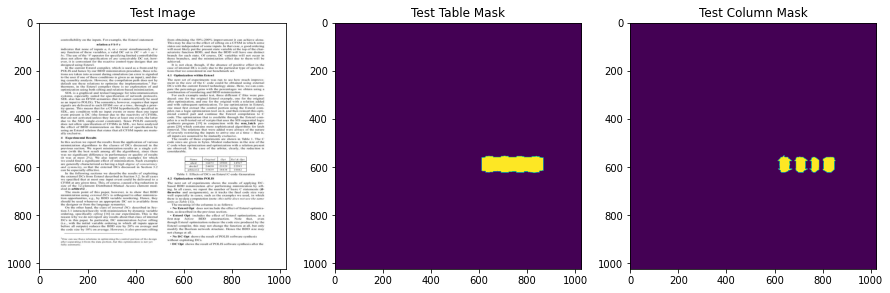

Table F1 : 0.956
Column F1 : 0.884
Index : 2


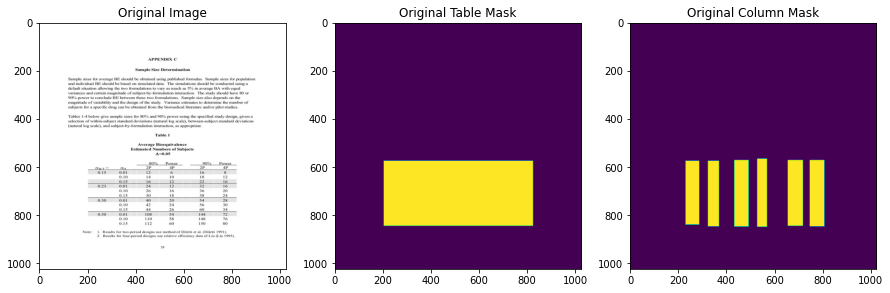

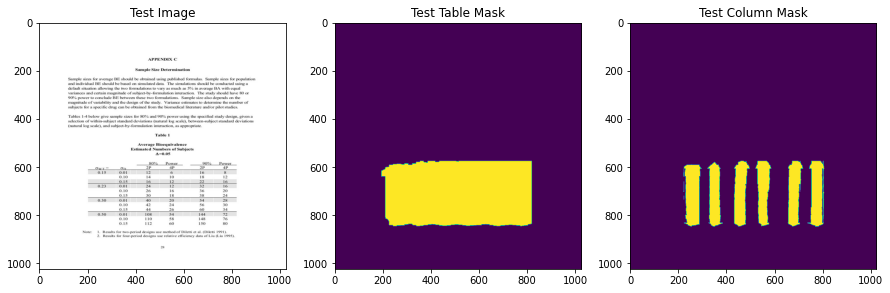

Table F1 : 0.976
Column F1 : 0.867
Index : 3


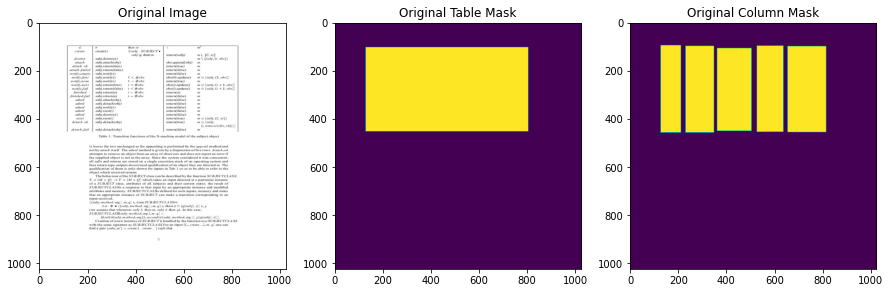

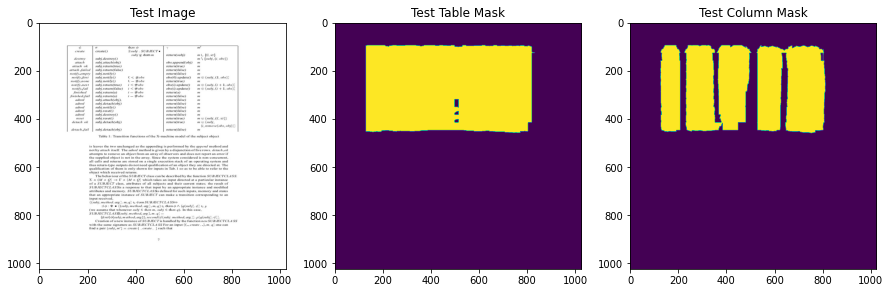

Table F1 : 0.975
Column F1 : 0.936
Index : 4


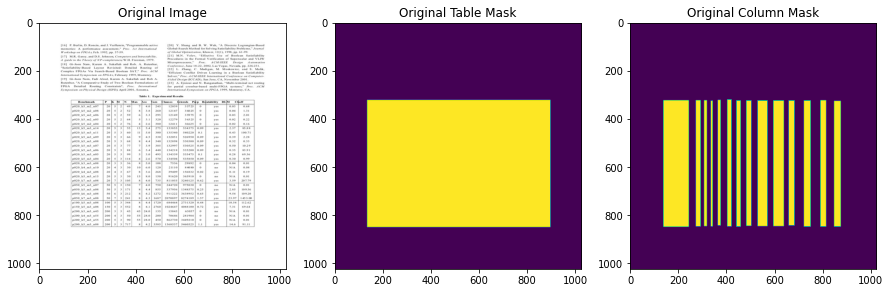

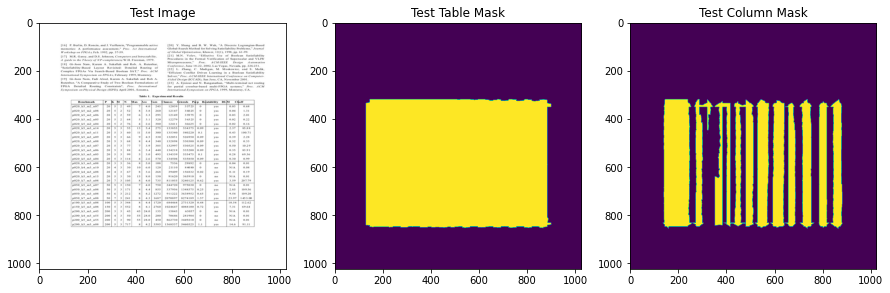

Table F1 : 0.985
Column F1 : 0.865


In [21]:
for i in best_pred_idx[:5]:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
    print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
    print("=" * 40)
          
    

#### Observations

- From above Images, we can see that Worst predictions are given by images with colored tables. Model didnt predict any thing and F1 score is close to 0

- Good predictions come from those images which predicted good Table mask, but it also predicted columns in the table where in actual there were no columns.

- Best Predictions are images which helped model learn table and column boundaries even without line demarcations

## Lets See Images based on Precision Scores

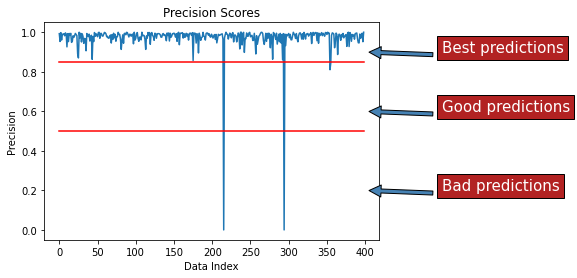

In [22]:
plt.plot(t_precision)
plt.plot([*range(len(t_precision))], [0.5]*len(t_precision), '-r', label='Bad Predictions')
plt.plot([*range(len(t_precision))], [0.85]*len(t_precision), '-r', label='Good Predictions')

#https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html
plt.annotate('Bad predictions', xy=(400, 0.2), xytext=(500, 0.2),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Good predictions', xy=(400, 0.6), xytext=(500, 0.6),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Best predictions', xy=(400, 0.9), xytext=(500, 0.9),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.title('Precision Scores')
plt.ylabel('Precision')
plt.xlabel('Data Index')
plt.show()

### Bad Predictions

In [23]:
bad_pred_idx = [i for i, x in enumerate(t_precision) if x < 0.5 ]

In [24]:
bad_pred_idx

[215, 294]

Index : 215


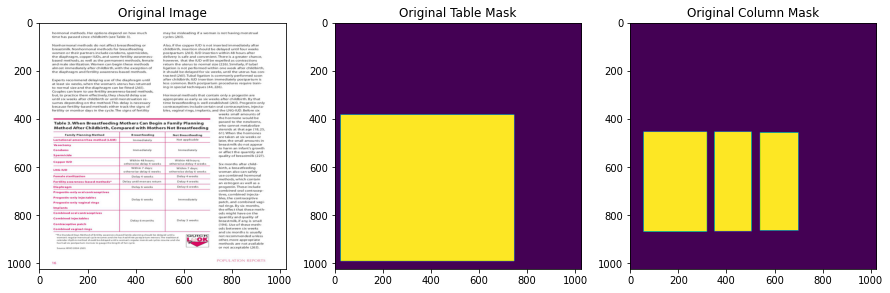

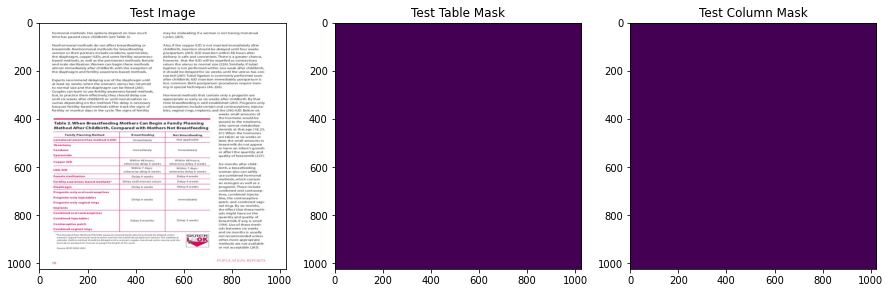

Table Precision : 0.0
Column Precision : 0.0
Index : 294


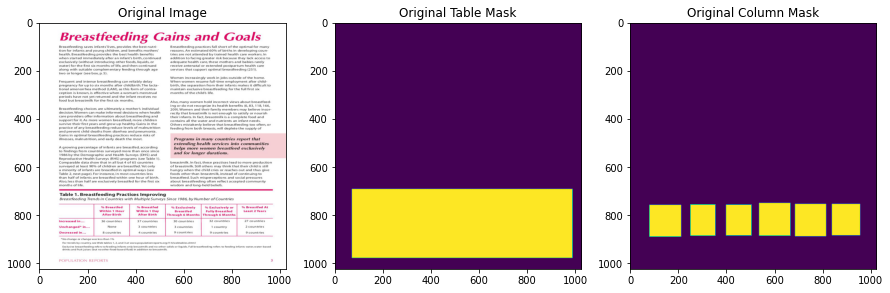

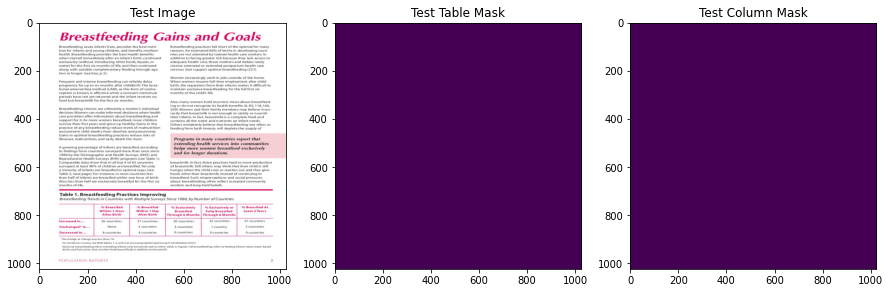

Table Precision : 0.0
Column Precision : 0.0


In [25]:
for i in bad_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table Precision : {precision_score(test_table, table_out, zero_division = 0)}")
    print(f"Column Precision : {precision_score(test_col, column_out, zero_division = 0)}")
    print("=" * 40)
          
    

### Good Prediction

In [26]:
good_pred_idx = [i for i, x in enumerate(t_precision) if (x >= 0.5) and (x < 0.85) ]

In [27]:
good_pred_idx

[354, 355]

Index : 354


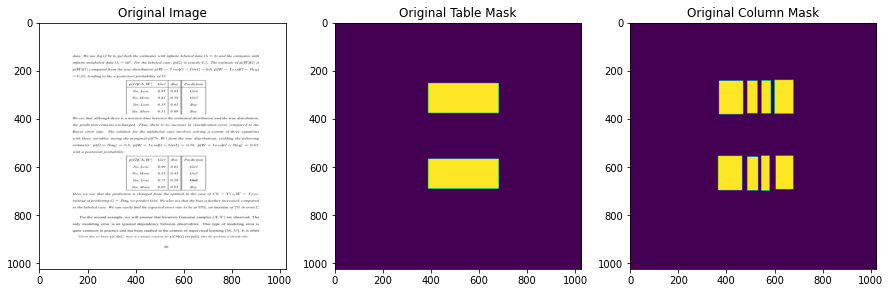

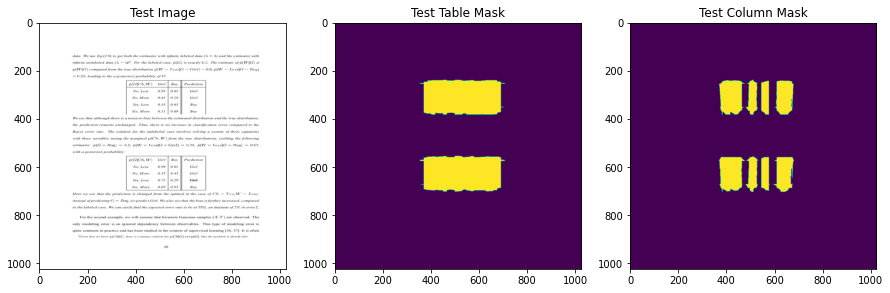

Table Precision : 0.810354059299913
Column Precision : 0.978626105974749
Index : 355


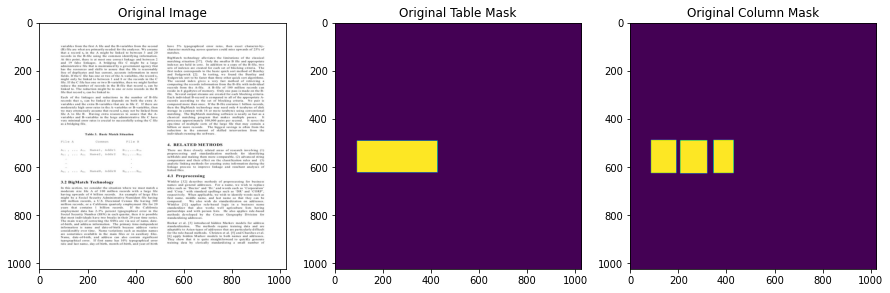

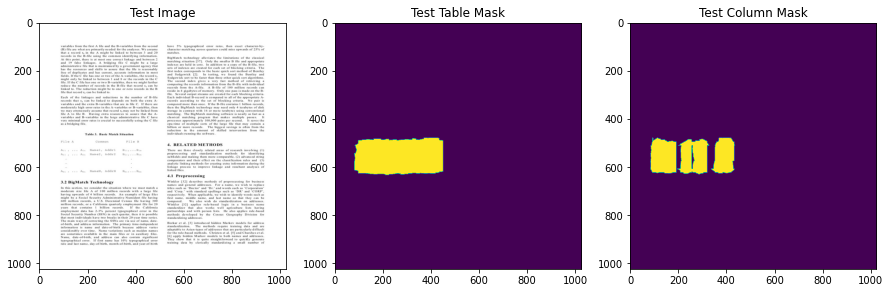

Table Precision : 0.8444130674455039
Column Precision : 0.9648589585792872


In [28]:
for i in good_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table Precision : {precision_score(test_table, table_out, zero_division = 0)}")
    print(f"Column Precision : {precision_score(test_col, column_out, zero_division = 0)}")
    print("=" * 40)
          
    

### Best Predictions

In [29]:
best_pred_idx = [i for i, x in enumerate(t_precision) if x >= 0.85 ]

Index : 0


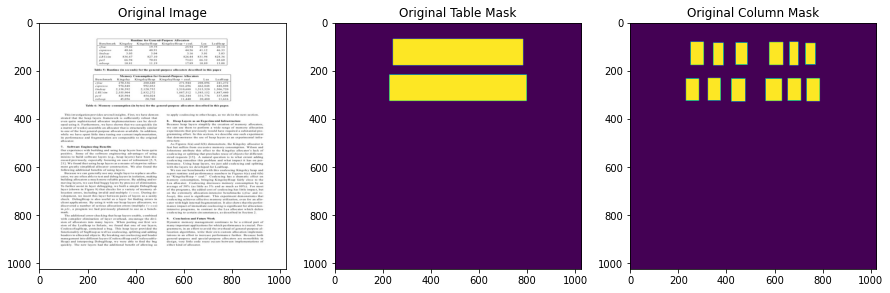

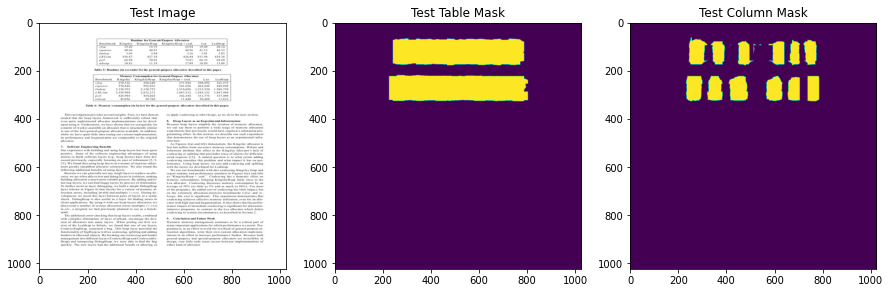

Table Precision : 0.9929297469229705
Column Precision : 0.8430564311462425
Index : 1


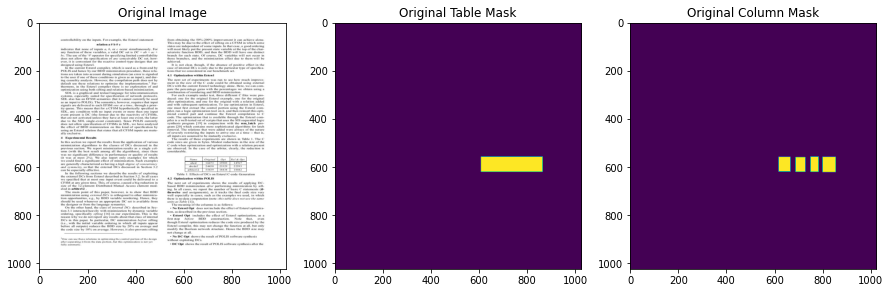

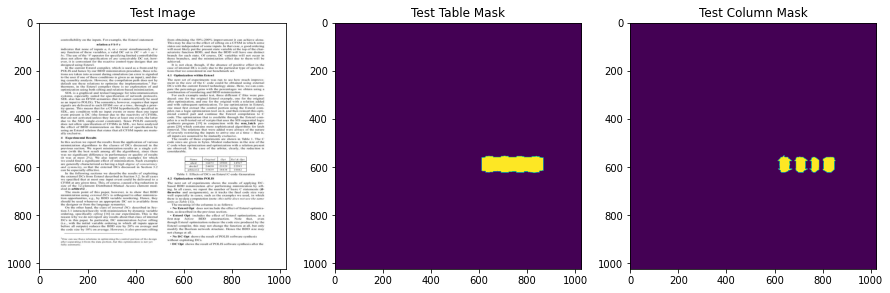

Table Precision : 0.9533004318322024
Column Precision : 0.9447061232848658
Index : 2


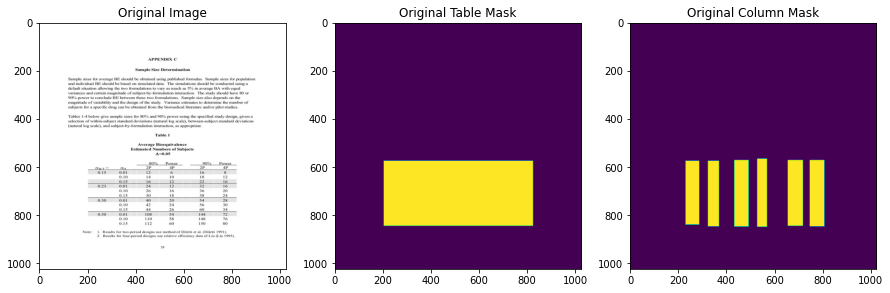

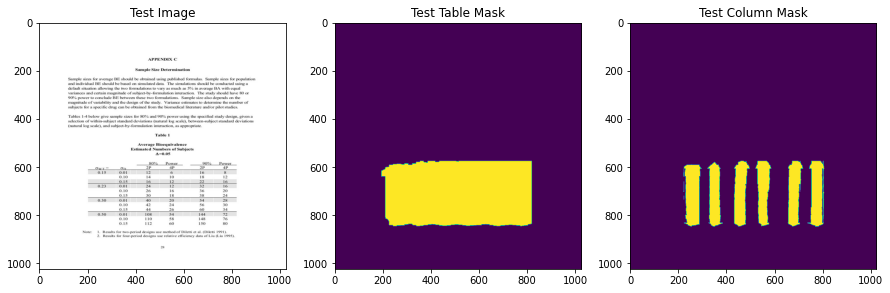

Table Precision : 0.9980866629150253
Column Precision : 0.9524413020277481
Index : 3


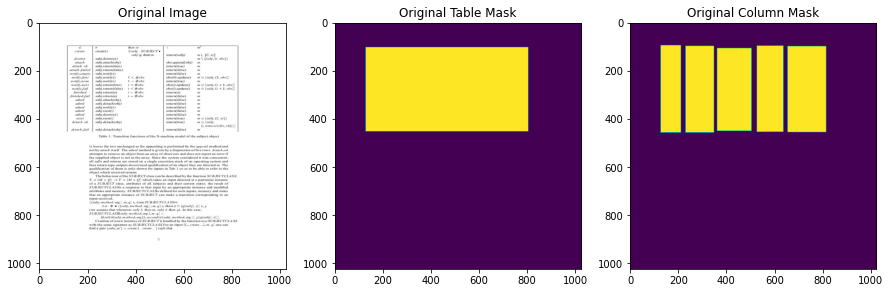

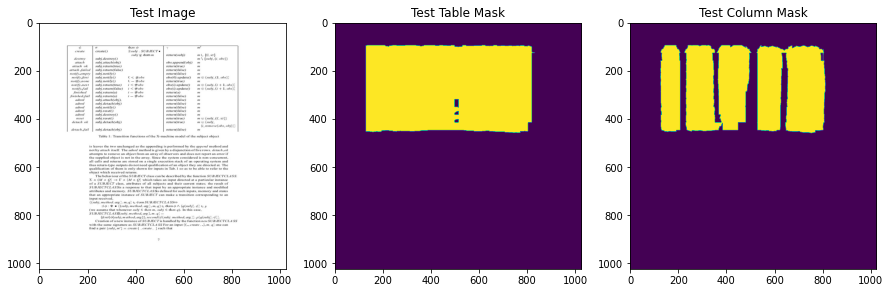

Table Precision : 0.9603183772498082
Column Precision : 0.9824003874033383
Index : 4


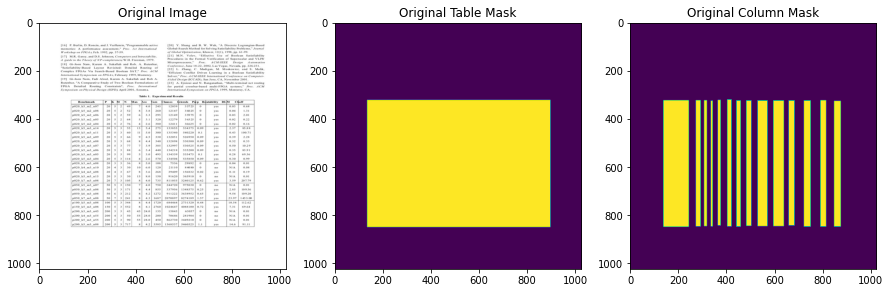

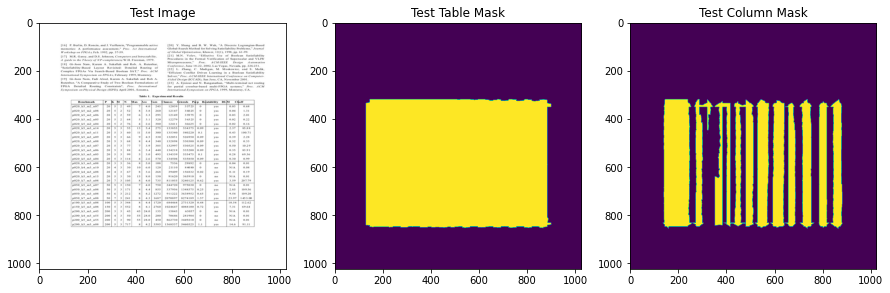

Table Precision : 0.988193244443103
Column Precision : 0.8286924702992


In [30]:
for i in best_pred_idx[:5]:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table Precision : {precision_score(test_table, table_out, zero_division = 0)}")
    print(f"Column Precision : {precision_score(test_col, column_out, zero_division = 0)}")
    print("=" * 40)
          
    

## Lets See predictions based on Recall Scores

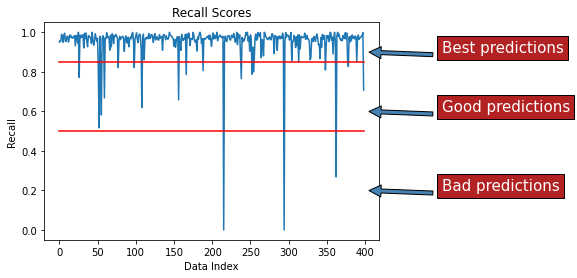

In [31]:
plt.plot(t_recall)
plt.plot([*range(len(t_recall))], [0.5]*len(t_recall), '-r', label='Bad Predictions')
plt.plot([*range(len(t_recall))], [0.85]*len(t_recall), '-r', label='Good Predictions')

#https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html
plt.annotate('Bad predictions', xy=(400, 0.2), xytext=(500, 0.2),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Good predictions', xy=(400, 0.6), xytext=(500, 0.6),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Best predictions', xy=(400, 0.9), xytext=(500, 0.9),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.title('Recall Scores')
plt.ylabel('Recall')
plt.xlabel('Data Index')
plt.show()

low recall means, the activations in the mask area is less than it should be.. So has False Negatives increase , the recall goes down

### Bad Predictions

In [32]:
bad_pred_idx = [i for i, x in enumerate(t_recall) if x < 0.5 ]

In [33]:
bad_pred_idx

[215, 294, 362]

Index : 215


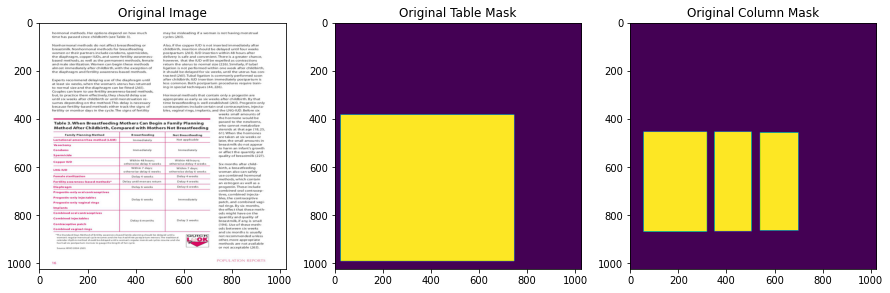

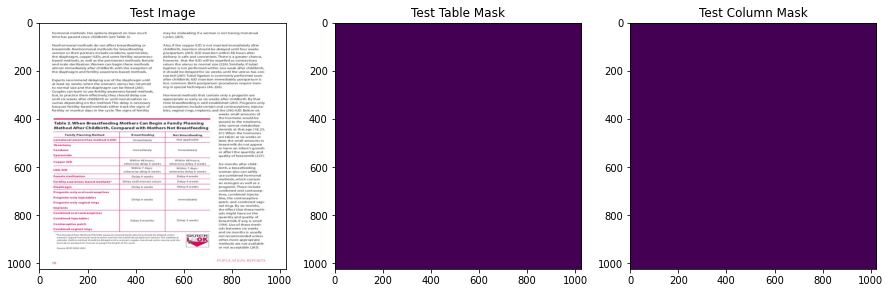

Table Recall : 0.0
Column Recall : 0.0
Index : 294


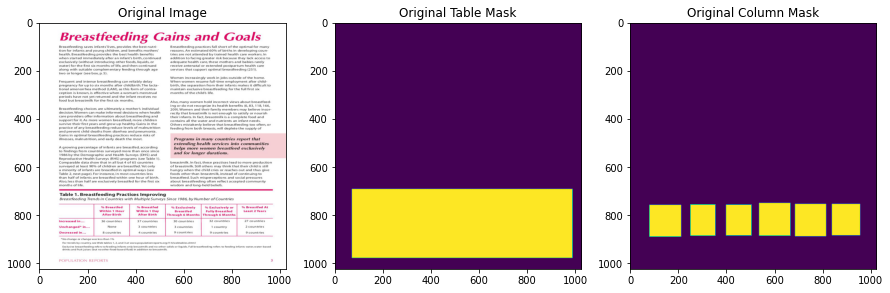

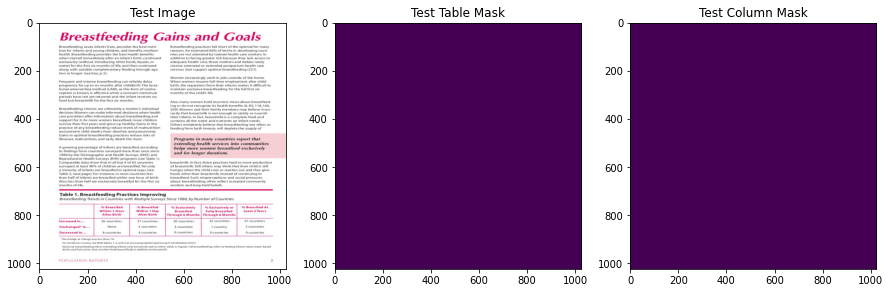

Table Recall : 0.0
Column Recall : 0.0
Index : 362


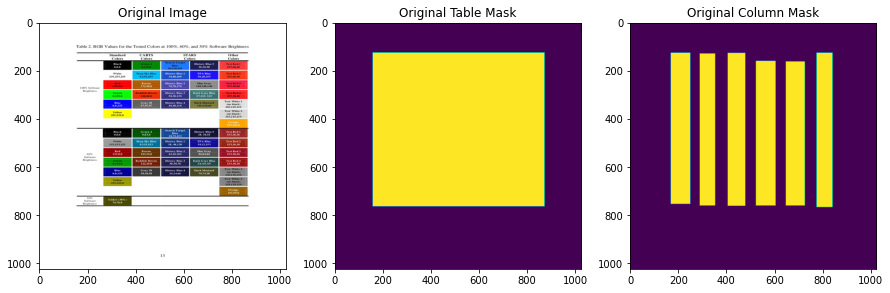

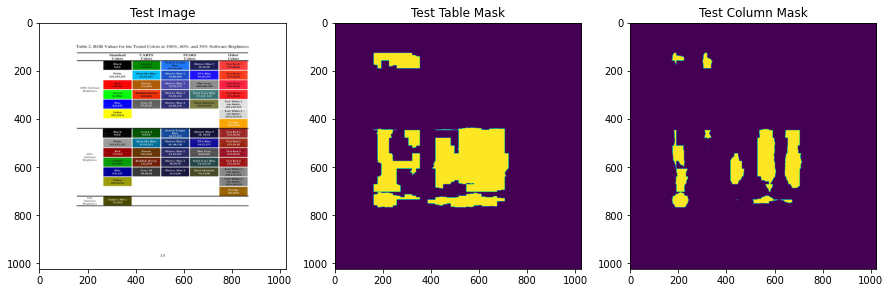

Table Recall : 0.2676931329056879
Column Recall : 0.17836871104687924


In [34]:
for i in bad_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table Recall : {recall_score(test_table, table_out, zero_division = 0)}")
    print(f"Column Recall : {recall_score(test_col, column_out, zero_division = 0)}")
    print("=" * 40)
          
    

### Good Prediction

In [35]:
good_pred_idx = [i for i, x in enumerate(t_recall) if (x >= 0.5) and (x < 0.85) ]

Index : 26


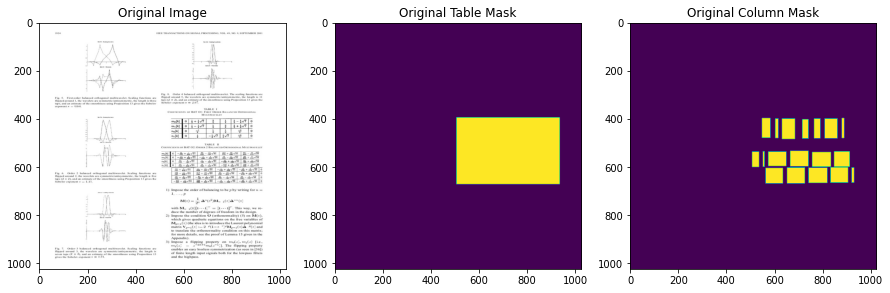

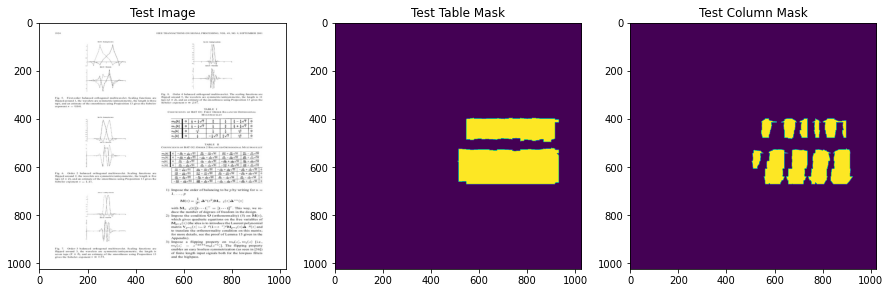

Table Recall : 0.771443959169591
Column Recall : 0.829590170976888
Index : 51


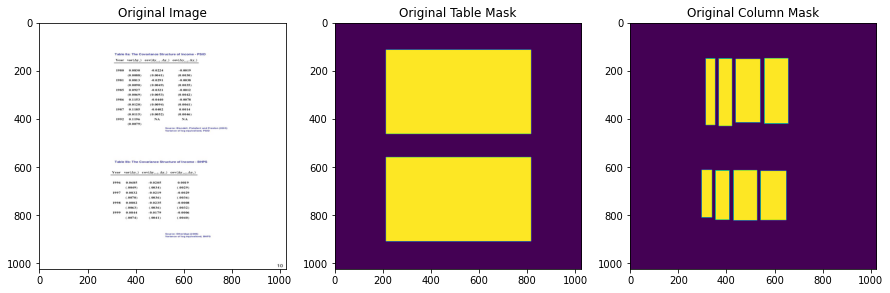

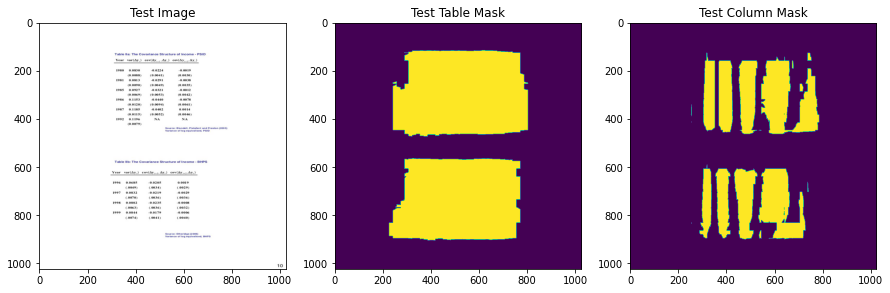

Table Recall : 0.8151791068929738
Column Recall : 0.831521433788415
Index : 52


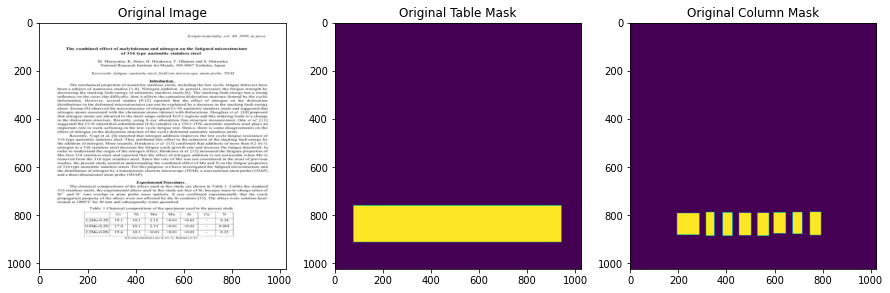

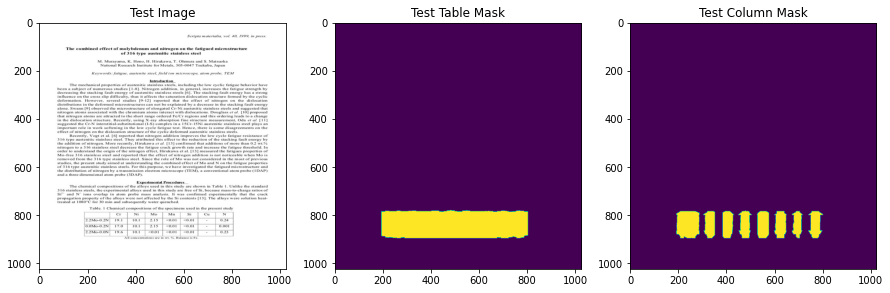

Table Recall : 0.5164283100567177
Column Recall : 0.9208867521367521
Index : 55


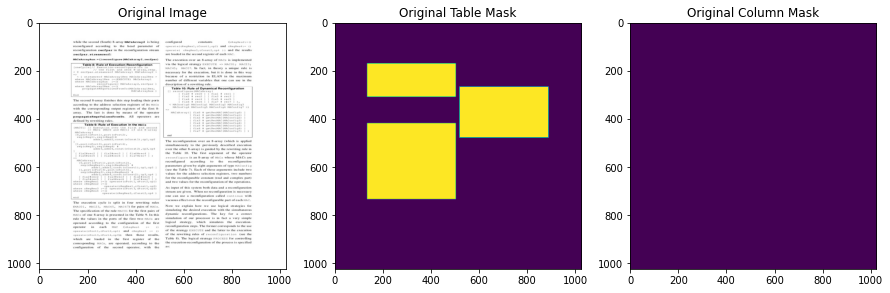

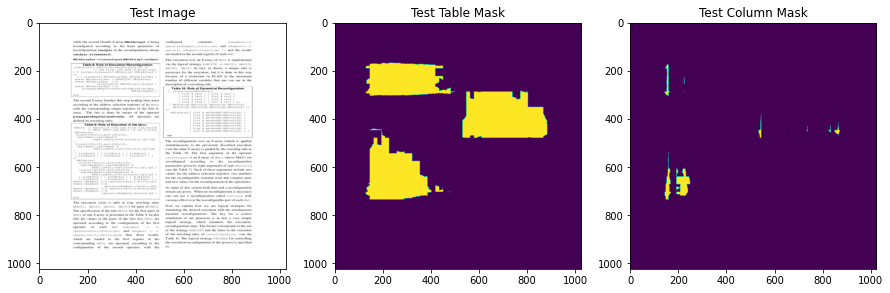

Table Recall : 0.5815637873523564
Column Recall : 0.0
Index : 59


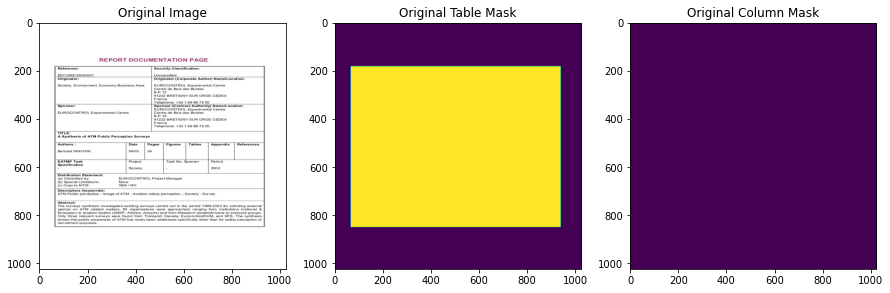

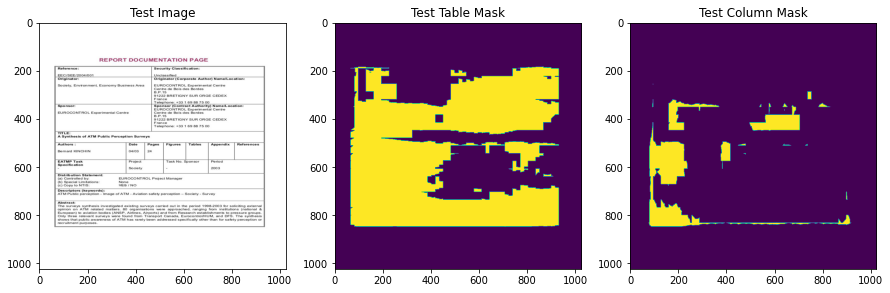

Table Recall : 0.6678652636942148
Column Recall : 0.0


In [37]:
for i in good_pred_idx[:5]:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table Recall : {recall_score(test_table, table_out, zero_division = 0)}")
    print(f"Column Recall : {recall_score(test_col, column_out, zero_division = 0)}")
    print("=" * 40)
          
    

### Best Predictions

In [38]:
best_pred_idx = [i for i, x in enumerate(t_recall) if x >= 0.85 ]

Index : 0


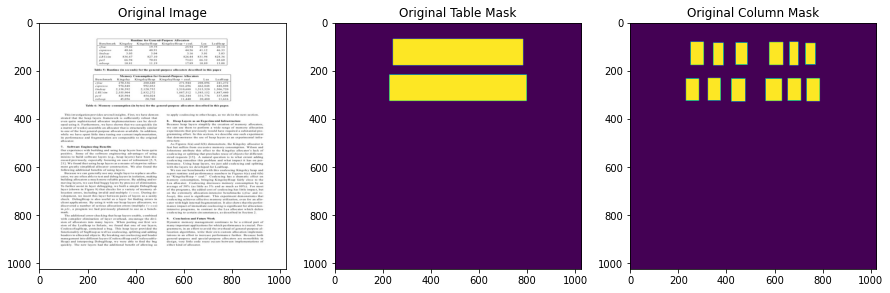

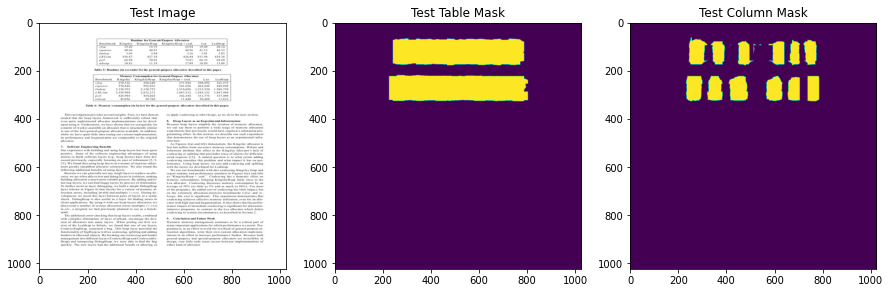

Table Precision : 0.9929297469229705
Column Precision : 0.8430564311462425
Index : 1


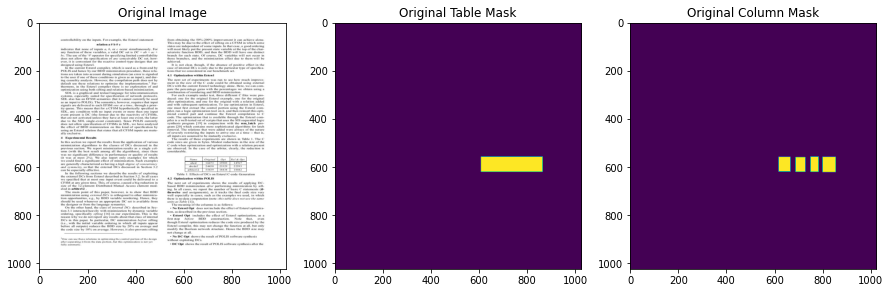

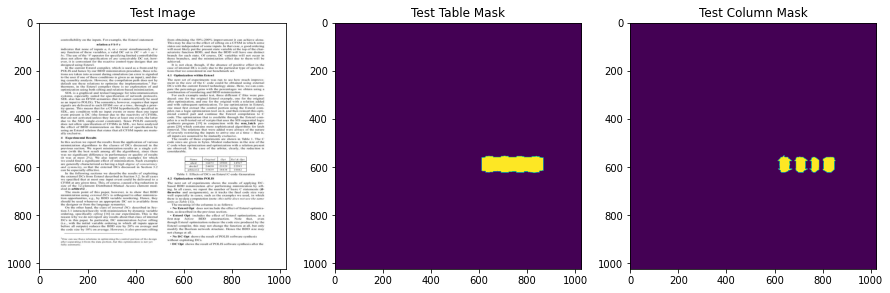

Table Precision : 0.9533004318322024
Column Precision : 0.9447061232848658
Index : 2


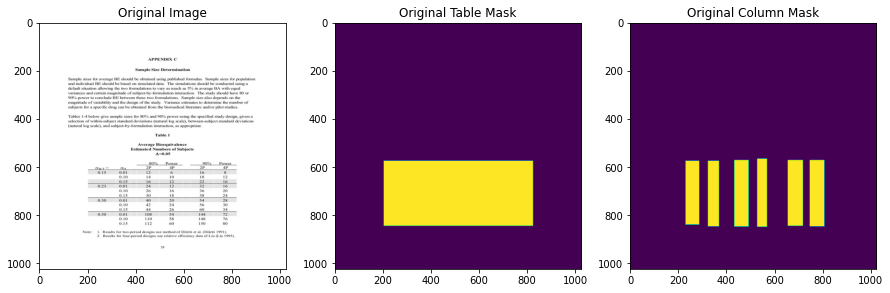

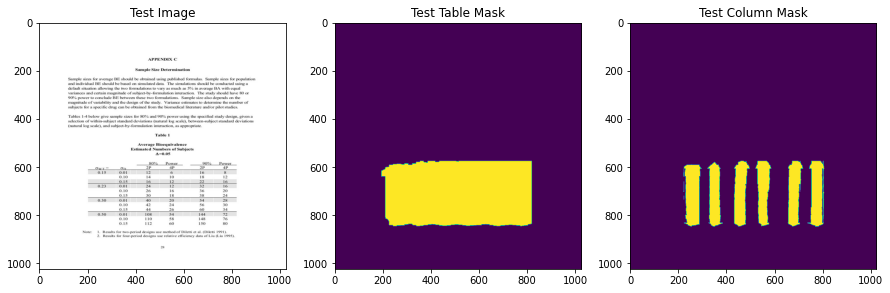

Table Precision : 0.9980866629150253
Column Precision : 0.9524413020277481
Index : 3


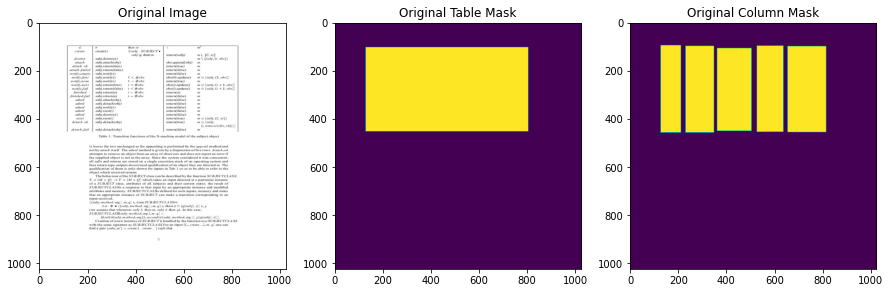

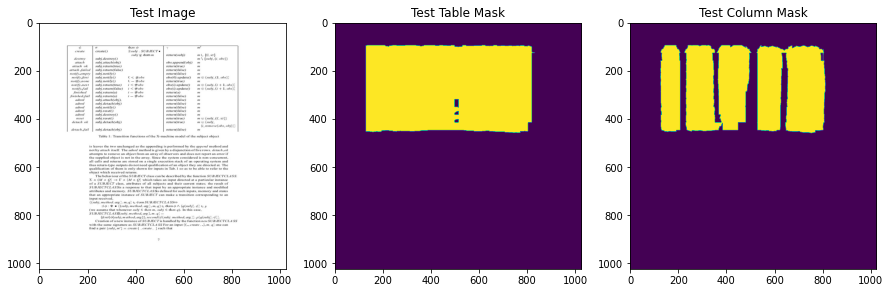

Table Precision : 0.9603183772498082
Column Precision : 0.9824003874033383
Index : 4


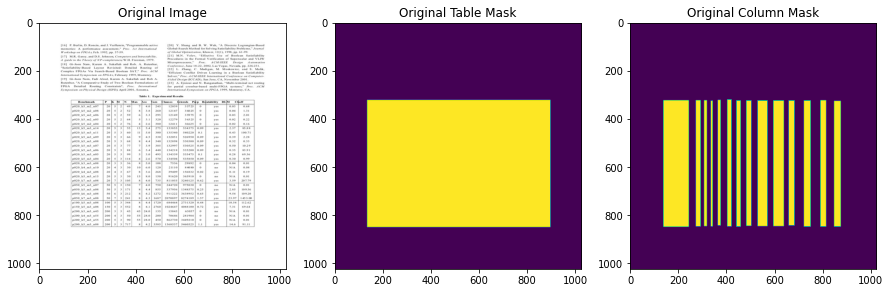

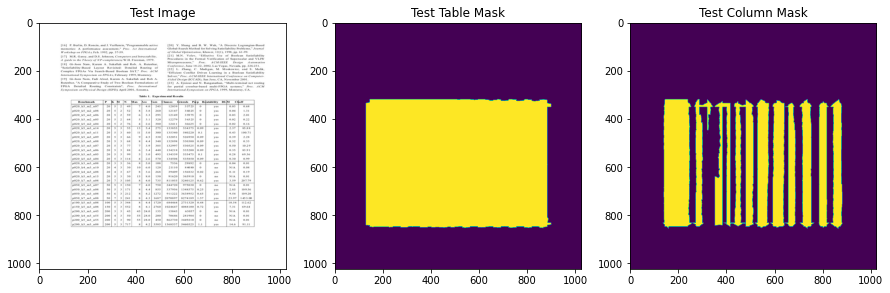

Table Precision : 0.988193244443103
Column Precision : 0.8286924702992


In [39]:
for i in best_pred_idx[:5]:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table Precision : {precision_score(test_table, table_out, zero_division = 0)}")
    print(f"Column Precision : {precision_score(test_col, column_out, zero_division = 0)}")
    print("=" * 40)
          
    

### Assumptions

- Similar trend can be seen from both precision and recall scores
- colored tables seems to be the problem where model didnt learn anything from such images, and F1, Precision and recall for such images are 0.0

### Fix:

- We can either remove such images, or 
- we can have unifrom data by converting them to grayscale and increase channels to 3 , and see if this can improve model performance

### After Fixing and Training the model again

In [40]:
model = TableNet(encoder = 'densenet', use_pretrained_model = True, basemodel_requires_grad = True)

print("Model Architecture and Trainable Paramerters")
print("="*50)
print(summary(model, torch.zeros((1, 3, 1024, 1024)), show_input=False, show_hierarchical=False))

Model Architecture and Trainable Paramerters
-------------------------------------------------------------------------------------------------------------
      Layer (type)                                              Output Shape         Param #     Tr. Param #
        DenseNet-1     [1, 256, 64, 64], [1, 512, 32, 32], [1, 1024, 32, 32]       6,951,808       6,951,808
          Conv2d-2                                          [1, 256, 32, 32]         262,400         262,400
            ReLU-3                                          [1, 256, 32, 32]               0               0
         Dropout-4                                          [1, 256, 32, 32]               0               0
          Conv2d-5                                          [1, 256, 32, 32]          65,792          65,792
            ReLU-6                                          [1, 256, 32, 32]               0               0
         Dropout-7                                          [1, 256, 32, 32]      

In [41]:
model = model.to(config.DEVICE)

#load checkpoint
last_epoch, tr_metrics,te_metrics = load_checkpoint(torch.load("densenet_config_4_model_checkpoint.pth.tar"), model)
display_metrics(last_epoch, tr_metrics,te_metrics)

Loading checkpoint...
Epoch: 45 
            Table Loss -- Train: 0.016 Test: 0.022
            Table Acc -- Train: 0.995 Test: 0.992
            Table F1 -- Train: 0.716 Test: 0.693
            Table Precision -- Train: 0.716 Test: 0.693
            Table Recall -- Train: 0.718 Test: 0.697
            
            Col Loss -- Train: 0.031 Test: 0.033
            Col Acc -- Train: 0.987 Test: 0.985
            Col F1 -- Train: 0.659 Test: 0.632
            Col Precision -- Train: 0.665 Test: 0.654
            Col Recall -- Train: 0.659 Test: 0.621
        


Model performance didnt improve in terms of Table F1 score and Column F1 Score.
But we need to check the output of images from Bad predictions, if they have improved /

### Output from Bad Images from previous Model on New Model

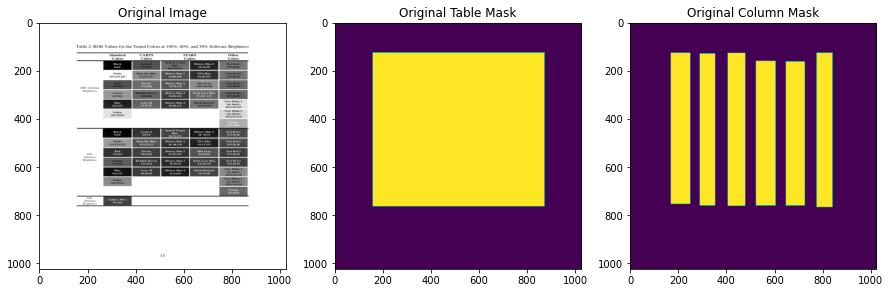

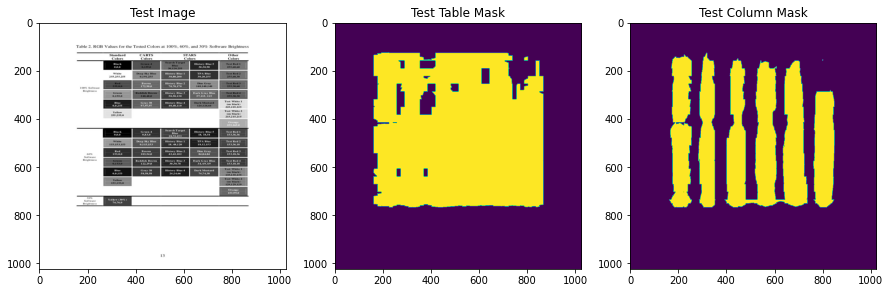

Table F1 : 0.946
Column F1 : 0.887


In [42]:
test_img = np.array(Image.open('../'+ 'marmot_processed/image_v2/10.1.1.160.604_22.jpg'))
test_table = np.array(Image.open('../'+ 'marmot_processed/table_mask/10.1.1.160.604_22_table_mask.png'))
test_col = np.array(Image.open('../'+ 'marmot_processed/col_mask/10.1.1.160.604_22_col_mask.png'))

display(test_img, test_table, test_col, title = 'Original')

table_out, column_out = get_TableMasks(test_img, model)

display(test_img, table_out, column_out, title = 'Test')

test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)

print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
print("=" * 40)

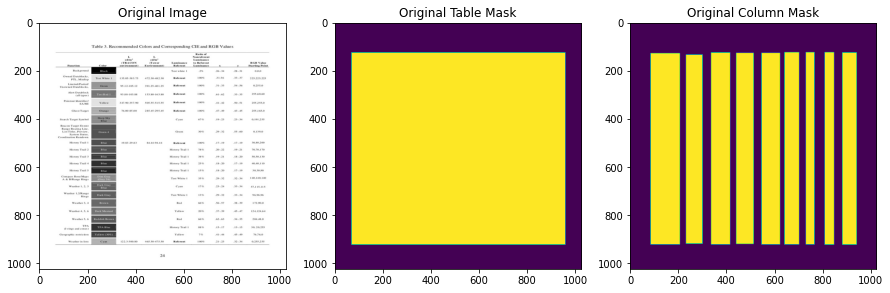

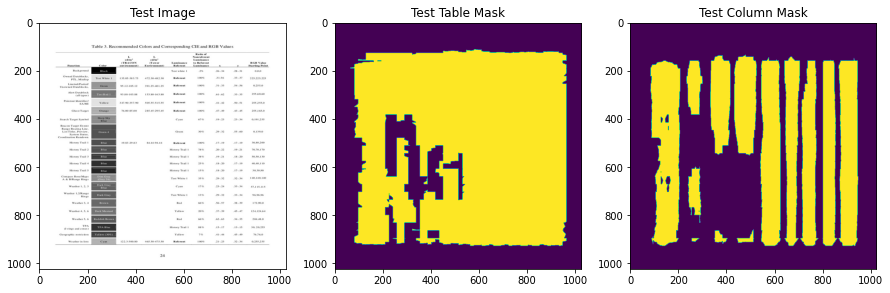

Table F1 : 0.928
Column F1 : 0.797


In [43]:
test_img = np.array(Image.open('../'+ 'marmot_processed/image_v2/10.1.1.160.604_33.jpg'))
test_table = np.array(Image.open('../'+ 'marmot_processed/table_mask/10.1.1.160.604_33_table_mask.png'))
test_col = np.array(Image.open('../'+ 'marmot_processed/col_mask/10.1.1.160.604_33_col_mask.png'))

display(test_img, test_table, test_col, title = 'Original')

table_out, column_out = get_TableMasks(test_img, model)

display(test_img, table_out, column_out, title = 'Test')

test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)

print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
print("=" * 40)

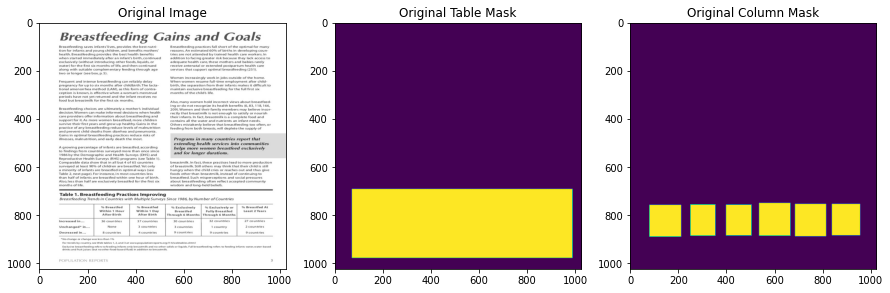

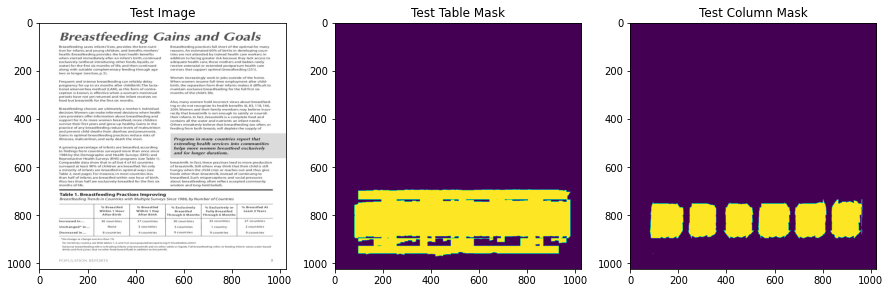

Table F1 : 0.895
Column F1 : 0.935


In [44]:
test_img = np.array(Image.open('../'+ 'marmot_processed/image_v2/10.1.1.176.3008_3.jpg'))
test_table = np.array(Image.open('../'+ 'marmot_processed/table_mask/10.1.1.176.3008_3_table_mask.png'))
test_col = np.array(Image.open('../'+ 'marmot_processed/col_mask/10.1.1.176.3008_3_col_mask.png'))

display(test_img, test_table, test_col, title = 'Original')

table_out, column_out = get_TableMasks(test_img, model)

display(test_img, table_out, column_out, title = 'Test')

test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)

print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
print("=" * 40)

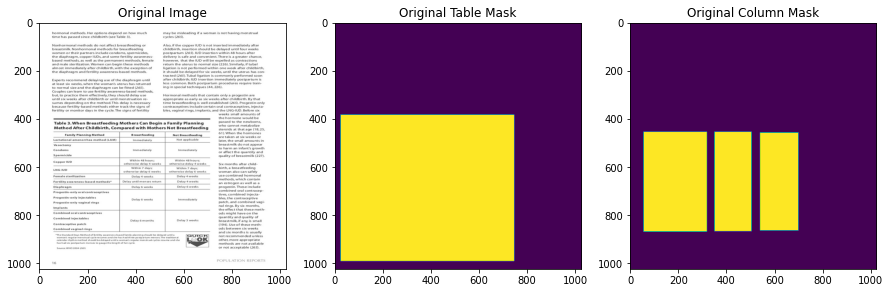

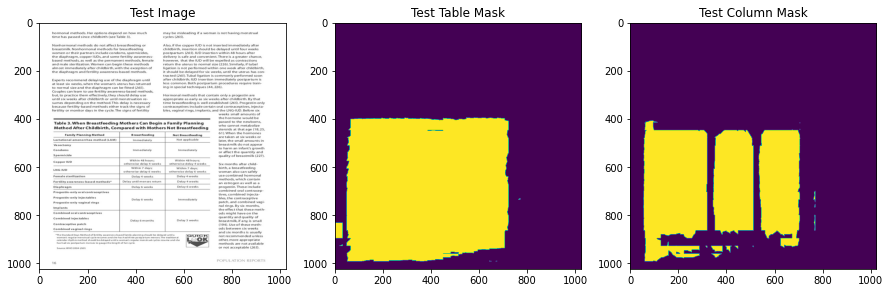

Table F1 : 0.929
Column F1 : 0.925


In [45]:
test_img = np.array(Image.open('../'+ 'marmot_processed/image_v2/10.1.1.176.3008_16.jpg'))
test_table = np.array(Image.open('../'+ 'marmot_processed/table_mask/10.1.1.176.3008_16_table_mask.png'))
test_col = np.array(Image.open('../'+ 'marmot_processed/col_mask/10.1.1.176.3008_16_col_mask.png'))

display(test_img, test_table, test_col, title = 'Original')

table_out, column_out = get_TableMasks(test_img, model)

display(test_img, table_out, column_out, title = 'Test')

test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)

print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
print("=" * 40)

### Observations

- From outputting no predictions for Table and column on coloured images, we managed to get F1 score on both table and column to 0.92

### Lets see how many bad images are in training data as per model

In [46]:
processed_data = pd.read_csv(config.DATAPATH)
train_data, test_data  = train_test_split(processed_data, test_size = 0.2, random_state = config.SEED, stratify = processed_data.hasTable)

### Check Train Data

In [47]:
train_data = train_data[train_data.hasTable == 1]

In [48]:
t_precision, t_recall, t_f1 = [], [], []
c_precision, c_recall, c_f1 = [], [], []

In [49]:
for i in tqdm(range(len(train_data))):
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = (np.array(Image.open("../" + train_data.iloc[i,1]))/255.0).reshape(-1,1)
    test_col = (np.array(Image.open("../" + train_data.iloc[i,2]))/255.0).reshape(-1,1)

    table_out, column_out = get_TableMasks(test_img, model)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)

    t_precision.append(precision_score(test_table, table_out, zero_division = 0))
    t_recall.append(recall_score(test_table, table_out, zero_division = 0))
    t_f1.append(f1_score(test_table, table_out, zero_division = 0))
    
    c_precision.append(precision_score(test_col, column_out, zero_division = 0))
    c_recall.append(recall_score(test_table, table_out, zero_division = 0))
    c_f1.append(f1_score(test_table, table_out, zero_division = 0))
    

100%|████████████████████████████████████████████████████████████████████████████████| 399/399 [13:55<00:00,  2.09s/it]


### Lets pick a threshold for categorizing worst, good and best predictions

**0.0 - 0.50 : Bad Predictions**

**0.5 - 0.85 : Good Predictions**

**0.85 - 0.1 : Best Predictions**



## Lets See Images based on F1 Scores

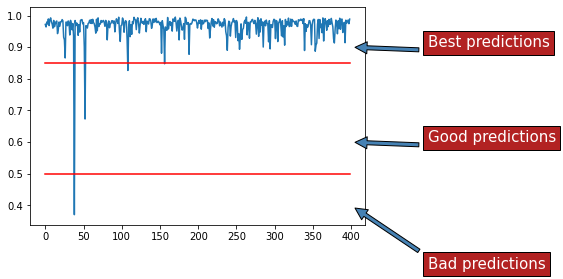

In [51]:
plt.plot(t_f1)
plt.plot([*range(len(t_f1))], [0.5]*len(t_f1), '-r', label='Bad Predictions')
plt.plot([*range(len(t_f1))], [0.85]*len(t_f1), '-r', label='Good Predictions')

#https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.annotate.html
plt.annotate('Bad predictions', xy=(400, 0.4), xytext=(500, 0.2),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Good predictions', xy=(400, 0.6), xytext=(500, 0.6),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')

plt.annotate('Best predictions', xy=(400, 0.9), xytext=(500, 0.9),
             bbox=dict(boxstyle='square', fc='firebrick'),
             arrowprops=dict(facecolor='steelblue', shrink=0.05), fontsize=15, color='white')
plt.show()

### Bad Predictions

In [52]:
bad_pred_idx = [i for i, x in enumerate(t_f1) if x < 0.5 ]

In [53]:
bad_pred_idx

[38]

Index : 38


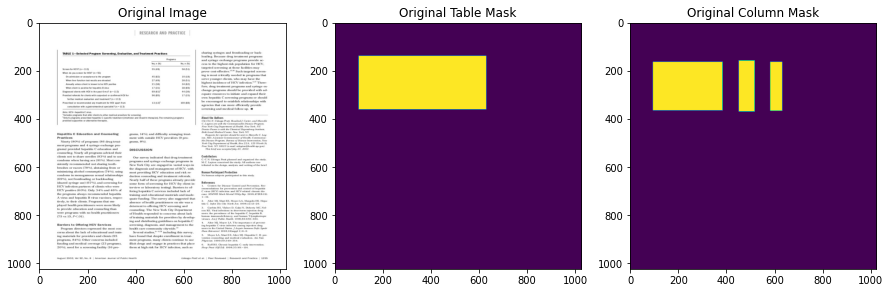

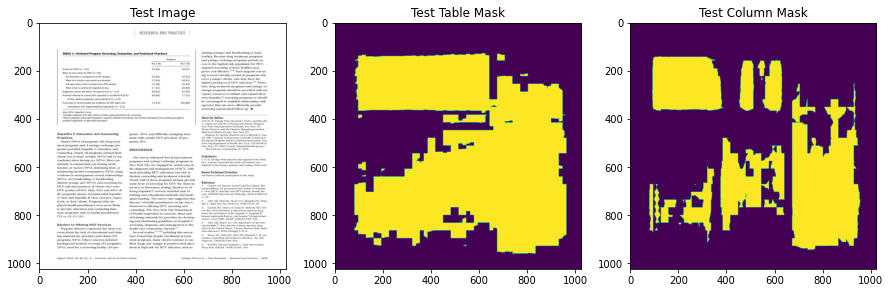

Table F1 : 0.371
Column F1 : 0.396


In [54]:
for i in bad_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
    print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
    print("=" * 40)
          
    

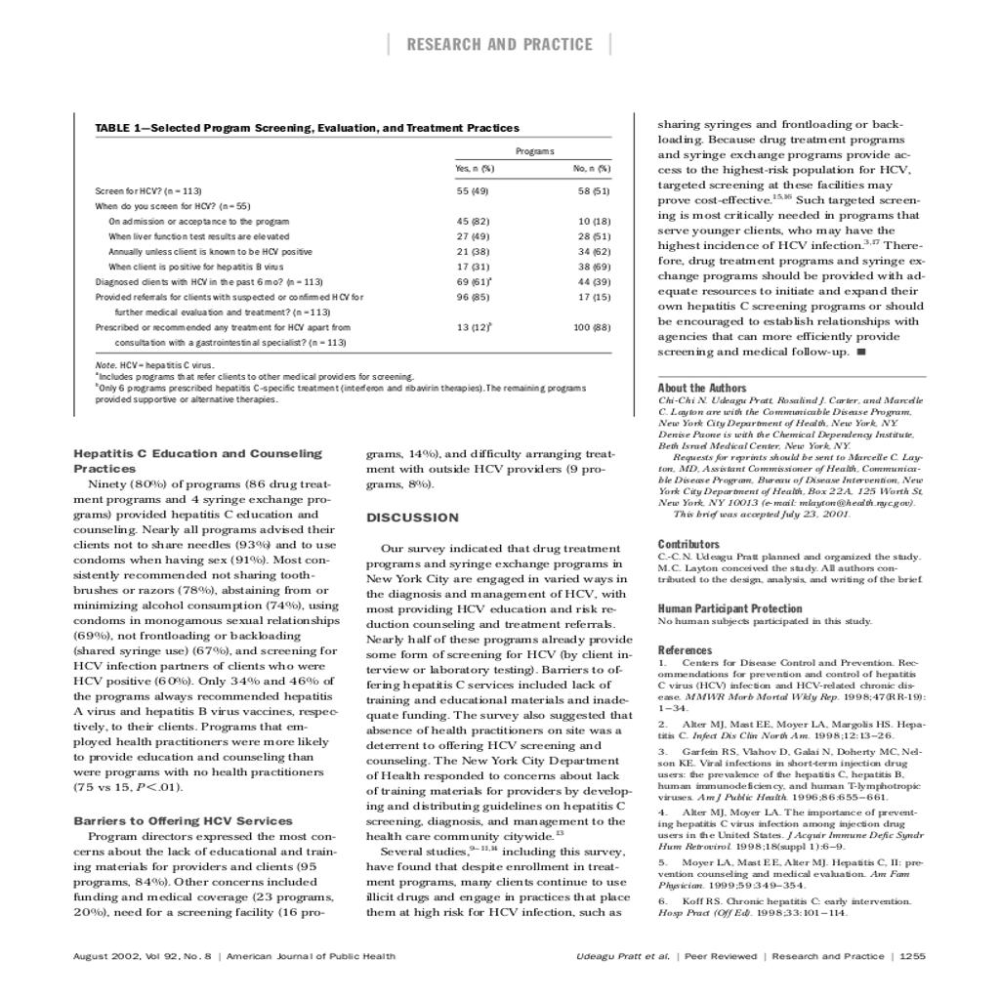

In [55]:
Image.open('../'+ train_data.iloc[38,0])

### Good Prediction

In [56]:
good_pred_idx = [i for i, x in enumerate(t_f1) if (x >= 0.5) and (x < 0.85) ]

In [57]:
good_pred_idx

[52, 108, 156]

Index : 52


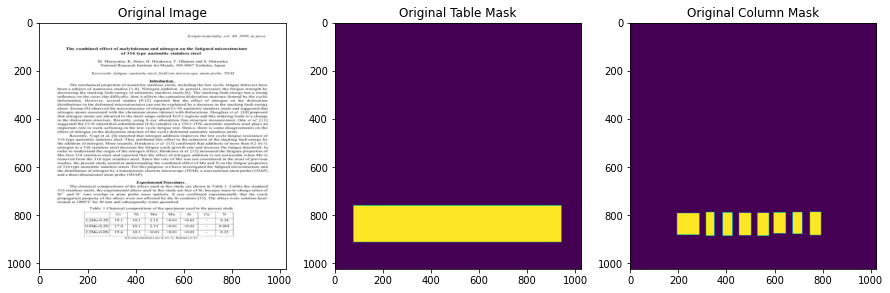

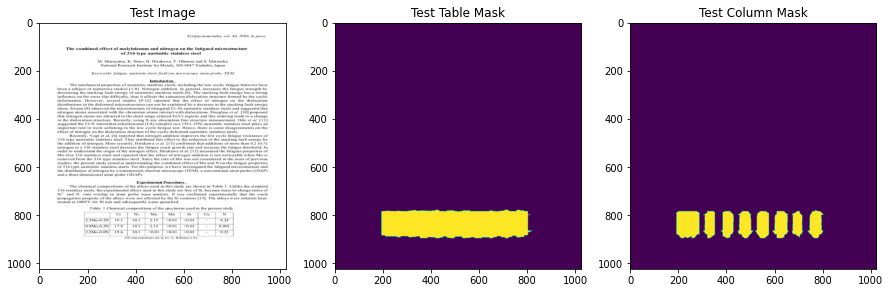

Table F1 : 0.673
Column F1 : 0.893
Index : 108


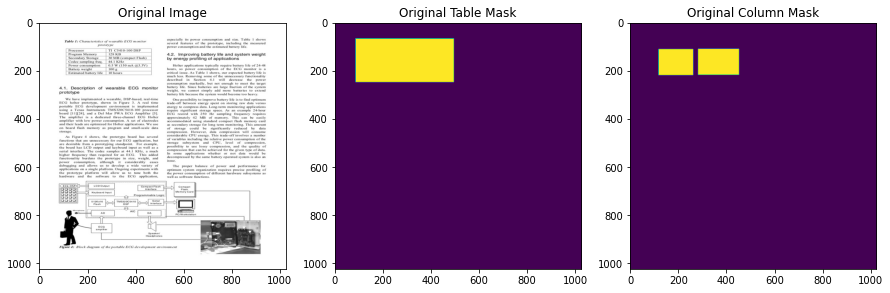

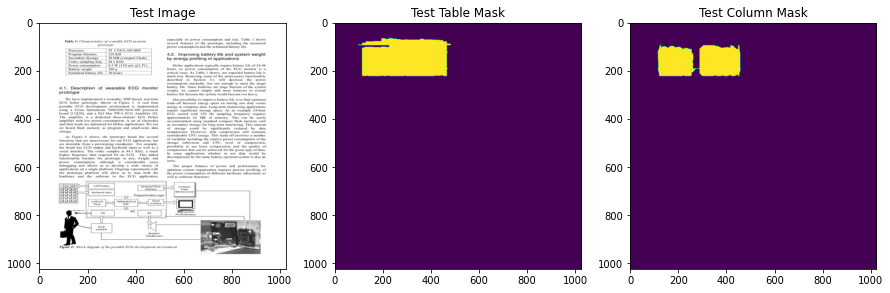

Table F1 : 0.826
Column F1 : 0.923
Index : 156


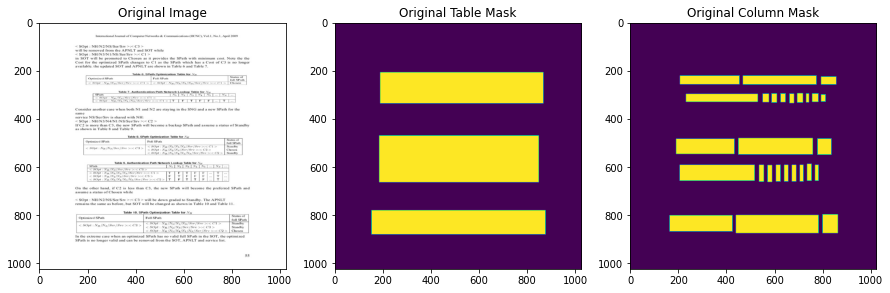

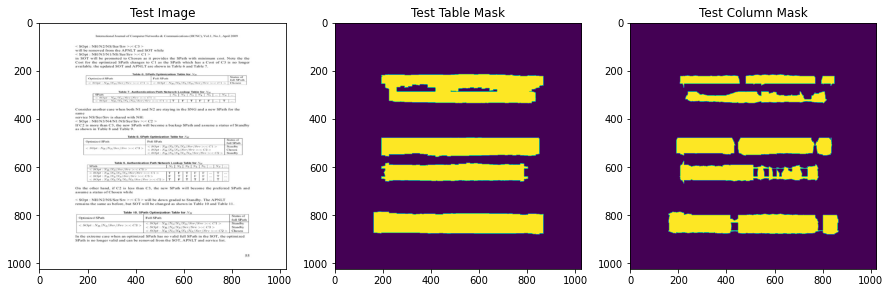

Table F1 : 0.847
Column F1 : 0.906


In [58]:
for i in good_pred_idx:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
    print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
    print("=" * 40)
          
    

### Best Predictions

In [59]:
best_pred_idx = [i for i, x in enumerate(t_f1) if x >= 0.85 ]

Index : 0


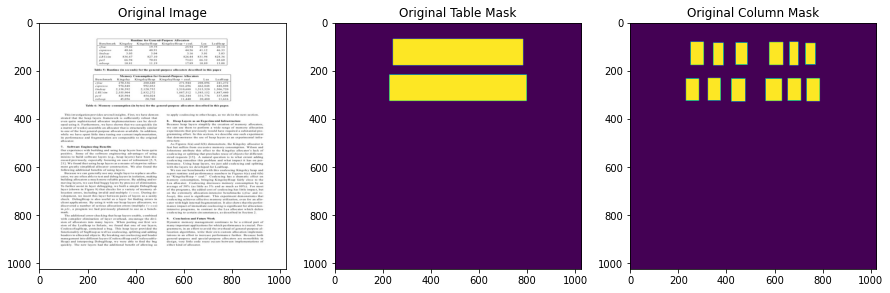

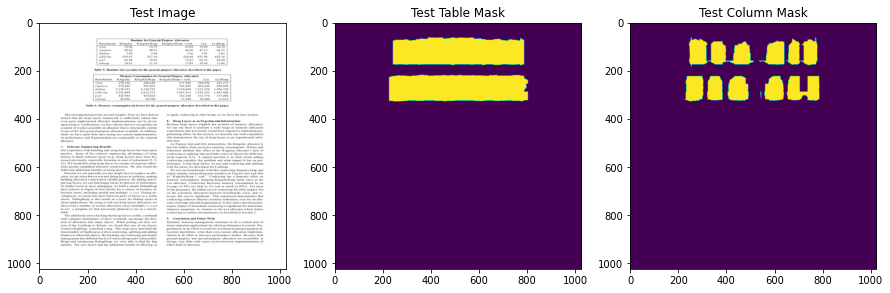

Table F1 : 0.972
Column F1 : 0.841
Index : 1


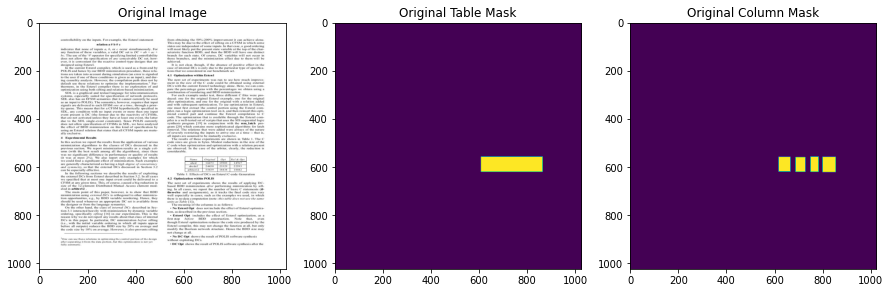

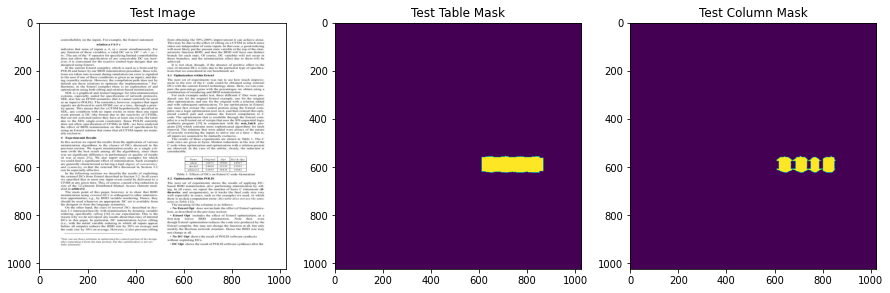

Table F1 : 0.964
Column F1 : 0.895
Index : 2


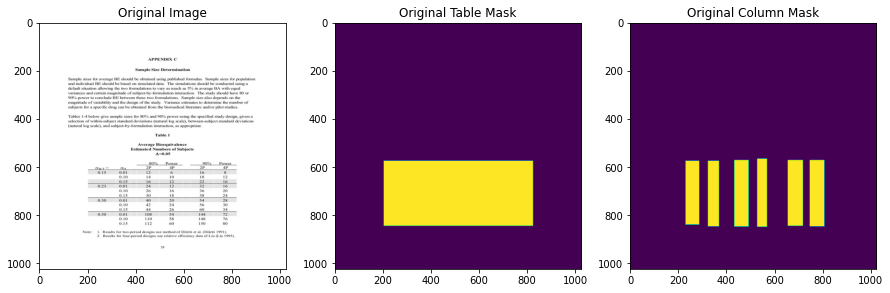

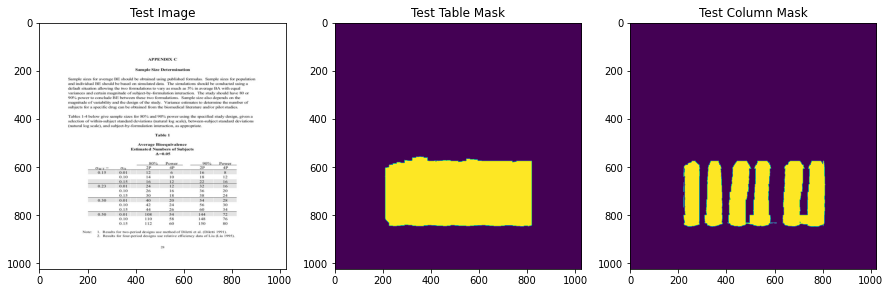

Table F1 : 0.979
Column F1 : 0.856
Index : 3


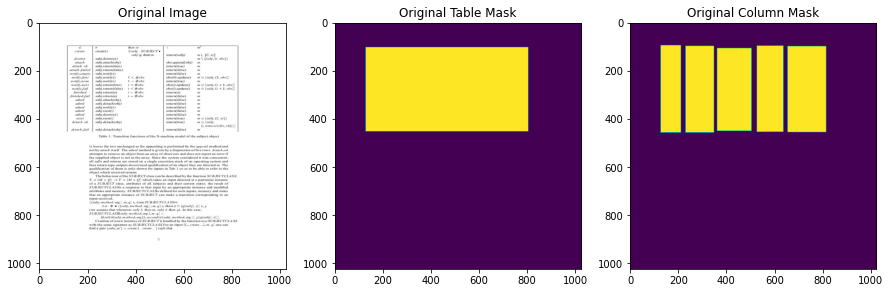

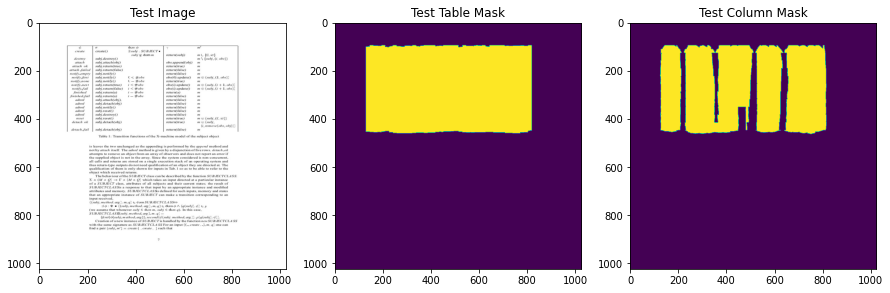

Table F1 : 0.973
Column F1 : 0.952
Index : 4


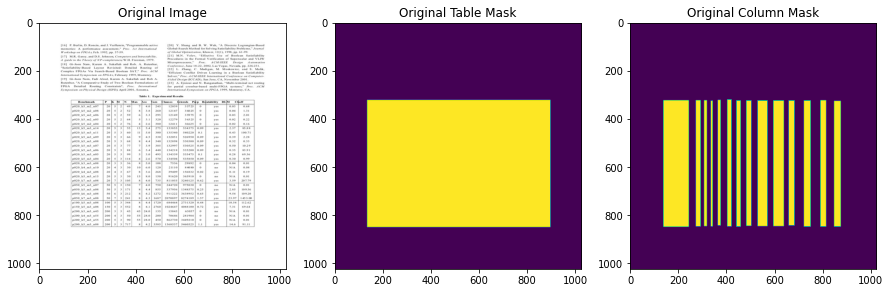

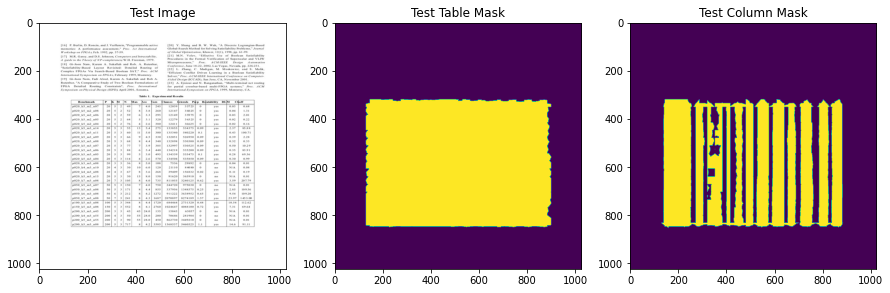

Table F1 : 0.989
Column F1 : 0.808


In [60]:
for i in best_pred_idx[:5]:
    print(f"Index : {i}")
    test_img = np.array(Image.open('../'+ train_data.iloc[i,0]))
    test_table = np.array(Image.open('../'+ train_data.iloc[i,1]))
    test_col = np.array(Image.open('../'+ train_data.iloc[i,2]))

    display(test_img, test_table, test_col, title = 'Original')
    
    table_out, column_out = get_TableMasks(test_img, model)
    
    display(test_img, table_out, column_out, title = 'Test')

    test_table, test_col = (test_table/255.0).reshape(-1,1), (test_col/255.0).reshape(-1,1)
    table_out, column_out = table_out.reshape(-1,1), column_out.reshape(-1,1)
    
    print(f"Table F1 : {f1_score(test_table, table_out, zero_division = 0):.3f}")
    print(f"Column F1 : {f1_score(test_col, column_out, zero_division = 0):.3f}")
    print("=" * 40)
          
    

### Observations

- As seen from above , only 1 bad image, which model couldnt train better. and as seen from the image, there were no specific table boundaries , thus model confused between other paragraphs as they were tables too

- There were only 2 good images, and rest seems be in best category